In [1]:
import os
import random
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import load_img, img_to_array

# Set the desired image size
image_size = (224, 224)
embedding_size = 64

base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(image_size[0], image_size[1], 3))

base_model.summary()

Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                           

In [4]:
import pandas as pd
df=pd.read_csv("new_deployment_data/new_deployment_data/enroll_train_meta.csv")
df.head()

,owner_name,image_name,pet_id,pet_type,pet_name,house_id
0,Amy Mezera,Lilo Front profile brighter (2).jpg,C1,cat,Lilo,house_1
1,Amy Mezera,Lilo Left profile (2).jpg,C1,cat,Lilo,house_1
2,Amy Mezera,Lilo_video_frame_0.JPG,C1,cat,Lilo,house_1
3,Amy Mezera,Lilo_video_frame_120.JPG,C1,cat,Lilo,house_1
4,Amy Mezera,Lilo_video_frame_150.JPG,C1,cat,Lilo,house_1


In [26]:
df[df["owner_name"]=="petfinder"].head()

,owner_name,image_name,pet_id,pet_type,pet_name,house_id
198,petfinder,ae380dc8-5cc8-45da-b8aa-4b3c8ecf2a99.jpg,C453,cat,11580417,house_3616
199,petfinder,b22de332-25dd-4c82-88ac-db5b53133f5a.jpg,C453,cat,11580417,house_3616
200,petfinder,7c95ae4e-9bd5-4c34-aaea-3ccf154bbc31.jpg,C454,cat,12562173,house_13
201,petfinder,7df389c0-bddf-4fd4-bc5b-d6e7be002c86.jpg,C454,cat,12562173,house_13
202,petfinder,87ac8990-88de-4a35-bd90-1c9cb8877808.jpg,C454,cat,12562173,house_13


In [14]:
dir_path="D:/cat_id/training"
data1="D:/cat_id/Data-1-cats_images_including_video_frames/"
if os.path.isdir(dir_path):
    print(1)

In [64]:
for i in df.iterrows():
    if i[1]["owner_name"]=="petfinder":
        s=i[1]["pet_name"]
        data1=f"D:/cat_id/Data-2-petfinder_more_than_5_images/petfinder/{s}/"
        s1=i[1]["house_id"]
        if os.path.isdir(data1):
            if os.path.isdir(f"D:/cat_id/training/{s1}"):
                pass
            else:
                s2=i[1]["house_id"]
                os.makedirs(f"D:/cat_id/training/{s2}")
            s3=i[1]["image_name"]
            imag=f"D:/cat_id/Data-2-petfinder_more_than_5_images/petfinder/{s}/{s3}"
            shutil.copy2(imag,f"D:/cat_id/training/{s1}")
                
            

In [66]:
for i in df.iterrows():
    if i[1]["owner_name"]!="petfinder" and i[1]["owner_name"]!="petfinder_dog":
        s=i[1]["pet_name"]
        ow=i[1]["owner_name"]
        data1=f"D:/cat_id/Data-1-cats_images_including_video_frames/{ow}/{s}/"
        s1=i[1]["house_id"]
        if os.path.isdir(data1):
            if os.path.isdir(f"D:/cat_id/training/{s1}"):
                pass
            else:
                s2=i[1]["house_id"]
                os.makedirs(f"D:/cat_id/training/{s2}")
            s3=i[1]["image_name"]
            imag=f"D:/cat_id/Data-1-cats_images_including_video_frames/{ow}/{s}/{s3}"
            if os.path.isfile(imag):
                if os.path.isfile(f"D:/cat_id/training/{s1}/{s3}"):
                    print(1)
                    continue
                else:
                    print(2)
                    shutil.copy2(imag,f"D:/cat_id/training/{s1}")
                
            

1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2


In [60]:
df1=pd.read_csv("new_deployment_data/new_deployment_data/inference_test_meta.csv")
df1.tail()

,owner_name,image_name,pet_id,pet_type,pet_name,house_id
57669,petfinder_dog,53968789_1.jpg,DD53968789,dog,53968789,house_4116
57670,petfinder_dog,53968789_2.jpg,DD53968789,dog,53968789,house_4116
57671,petfinder_dog,53968720_3.jpg,DD53968720,dog,53968720,house_4116
57672,petfinder_dog,53968720_4.jpg,DD53968720,dog,53968720,house_4116
57673,petfinder_dog,53968715_2.jpg,DD53968715,dog,53968715,house_4116


In [70]:
for i in df.iterrows():
    if i[1]["owner_name"]=="petfinder":
        s=i[1]["pet_name"]
        data1=f"D:/cat_id/Data-2-petfinder_more_than_5_images/petfinder/{s}/"
        s1=i[1]["house_id"]
        if os.path.isdir(data1):
            if os.path.isdir(f"D:/cat_id/inference/{s1}"):
                pass
            else:
                s2=i[1]["house_id"]
                os.makedirs(f"D:/cat_id/inference/{s2}")
            s3=i[1]["image_name"]
            imag=f"D:/cat_id/Data-2-petfinder_more_than_5_images/petfinder/{s}/{s3}"
            shutil.copy2(imag,f"D:/cat_id/inference/{s1}")
                
            

In [71]:
for i in df.iterrows():
    if i[1]["owner_name"]!="petfinder" and i[1]["owner_name"]!="petfinder_dog":
        s=i[1]["pet_name"]
        ow=i[1]["owner_name"]
        data1=f"D:/cat_id/Data-1-cats_images_including_video_frames/{ow}/{s}/"
        s1=i[1]["house_id"]
        if os.path.isdir(data1):
            if os.path.isdir(f"D:/cat_id/inference/{s1}"):
                pass
            else:
                s2=i[1]["house_id"]
                os.makedirs(f"D:/cat_id/inference/{s2}")
            s3=i[1]["image_name"]
            imag=f"D:/cat_id/Data-1-cats_images_including_video_frames/{ow}/{s}/{s3}"
            if os.path.isfile(imag):
                if os.path.isfile(f"D:/cat_id/inference/{s1}/{s3}"):
                    print(1)
                    continue
                else:
                    print(2)
                    shutil.copy2(imag,f"D:/cat_id/inference/{s1}")
                
            

2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2


In [12]:
x=base_model.output
x=GlobalAveragePooling2D()(x)
embeddings=Dense(embedding_size,activation="relu")(x)
def contrastive_loss(y_true, y_pred, margin=1.0):
    # Calculate Euclidean distance between the embeddings
    embeddings1, embeddings2 = y_pred[:, :256], y_pred[:, 256:]
    euclidean_distance = tf.reduce_sum(tf.square(embeddings1 - embeddings2), axis=1)
    euclidean_distance = tf.sqrt(euclidean_distance)

    # Calculate contrastive loss
    loss = (1 - y_true) * tf.square(euclidean_distance) + y_true * tf.square(tf.maximum(margin - euclidean_distance, 0))
    loss = 0.5 * tf.reduce_mean(loss)

    return loss


model1=tf.keras.models.Model(base_model.input,outputs=embeddings)

# Define the Siamese network architecture
input_anchor = Input(shape=(224, 224, 3))
input_positive = Input(shape=(224, 224, 3))
input_negative = Input(shape=(224, 224, 3))



output_anchor = model1(input_anchor)
output_positive =  model1(input_anchor)
output_negative =  model1(input_anchor)
inputs = [input_anchor, input_positive, input_negative]
outputs = [output_anchor, output_positive, output_negative]

model=tf.keras.models.Model(base_model.input,outputs=outputs)

# Define the Siamese network architecture
input_anchor = Input(shape=(224, 224, 3))
input_positive = Input(shape=(224, 224, 3))
input_negative = Input(shape=(224, 224, 3))



output_anchor = model(input_anchor)
output_positive =  model(input_anchor)
output_negative =  model(input_anchor)



model.compile(optimizer=Adam(), loss=contrastive_loss)

train_data_dir = 'D:/cat_id/training1'
batch_size = 32
num_epochs = 10

image_files = os.listdir(train_data_dir)

def preprocess_image(file_path):
    img = load_img(file_path, target_size=image_size)
    img = img_to_array(img)
    img = img / 255.0  # Normalize pixel values
    return img


def generate_triplets(image_files, batch_size):
    while True:
        anchor_batch = []
        positive_batch = []
        negative_batch = []

        for _ in range(batch_size):
            # Randomly select an anchor image
            anchor_image = random.choice(image_files)
            anchor_path = os.path.join(train_data_dir, anchor_image)
            anchor_img = preprocess_image(anchor_path)

            # Get a positive image (same class as anchor)
            positive_image = random.choice(image_files)
            while positive_image == anchor_image:
                positive_image = random.choice(image_files)
            positive_path = os.path.join(train_data_dir, positive_image)
            positive_img = preprocess_image(positive_path)

            # Get a negative image (different class from anchor)
            negative_image = random.choice(image_files)
            while negative_image.split('_')[0] == anchor_image.split('_')[0]:
                negative_image = random.choice(image_files)
            negative_path = os.path.join(train_data_dir, negative_image)
            negative_img = preprocess_image(negative_path)

            anchor_batch.append(anchor_img)
            positive_batch.append(positive_img)
            negative_batch.append(negative_img)

        yield [np.array(anchor_batch), np.array(positive_batch), np.array(negative_batch)]

triplet_generator = generate_triplets(image_files, batch_size)

model.fit(triplet_generator, epochs=num_epochs, steps_per_epoch=len(image_files) // batch_size)





ValueError: Graph disconnected: cannot obtain value for tensor KerasTensor(type_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name='input_24'), name='input_24', description="created by layer 'input_24'") at layer "model_5". The following previous layers were accessed without issue: []

In [10]:
import tensorflow as tf
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.layers import Input, Flatten, Dense, Lambda
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.utils import shuffle
import numpy as np
import os

# Set the paths and parameters
data_folder = 'D:/cat_id/training1'
batch_size = 32
embedding_size = 64
epochs = 10

# Load the pre-trained ResNet50 model without the top classification layer
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

embedding = base_model.output
embedding = Flatten()(embedding)
embedding = Dense(embedding_size)(embedding)

model=tf.keras.models.Model(base_model.input,outputs=embedding)

# Define the Siamese network architecture
input_anchor = Input(shape=(224, 224, 3))
input_positive = Input(shape=(224, 224, 3))
input_negative = Input(shape=(224, 224, 3))



output_anchor = model(input_anchor)
output_positive =  model(input_anchor)
output_negative =  model(input_anchor)

siamese_model = Model(inputs=[input_anchor, input_positive, input_negative], outputs=[output_anchor, output_positive, output_negative])

# Define the Triplet Loss function
def triplet_loss(y_true, y_pred, alpha=0.2):
    anchor, positive, negative = y_pred
    positive_distance = tf.reduce_sum(tf.square(anchor - positive), axis=-1)
    negative_distance = tf.reduce_sum(tf.square(anchor - negative), axis=-1)
    loss = tf.maximum(positive_distance - negative_distance + alpha, 0.0)
    return tf.reduce_mean(loss)

# Compile the model with Triplet Loss
siamese_model.compile(optimizer=Adam(), loss=triplet_loss)

# Create an ImageDataGenerator for data augmentation
data_generator = ImageDataGenerator(rescale=1./255, rotation_range=30, width_shift_range=0.1, height_shift_range=0.1, shear_range=0.2, zoom_range=0.2, horizontal_flip=True, fill_mode='nearest')

# Generate positive and negative pairs for training
def generate_pairs(data_folder):
    pairs = []
    labels = []
    classes = sorted(os.listdir(data_folder))
    for idx, class_name in enumerate(classes):
        class_folder = os.path.join(data_folder, class_name)
        images = os.listdir(class_folder)
        for i in range(len(images)-1):
            for j in range(i+1, len(images)):
                pairs.append((os.path.join(class_folder, images[i]), os.path.join(class_folder, images[j])))
                labels.append(idx)
    return pairs, labels

# Function to load and preprocess images
def load_images(image_paths):
    images = []
    for image_path in image_paths:
        img = tf.keras.preprocessing.image.load_img(image_path, target_size=(224, 224))
        img = tf.keras.preprocessing.image.img_to_array(img)
        img = tf.keras.applications.resnet50.preprocess_input(img)
        images.append(img)
    return np.array(images)

# Generate positive and negative pairs and labels
pairs, labels = generate_pairs(data_folder)

# Split the pairs into training and validation sets
train_pairs, train_labels = shuffle(pairs, labels, random_state=42)
val_pairs, val_labels = train_pairs[:100], train_labels[:100]
train_pairs, train_labels = train_pairs[100:], train_labels[100:]

# Train the model
siamese_model.fit(
    [load_images(train_pairs[:, 0]), load_images(train_pairs[:, 1]), load_images(train_pairs[:, 1])],
    [train_labels, train_labels, train_labels],
    validation_data=([load_images(val_pairs[:, 0]), load_images(val_pairs[:, 1]), load_images(val_pairs[:, 1])], [val_labels, val_labels, val_labels]),
    batch_size=batch_size,
    epochs=epochs
)


TypeError: list indices must be integers or slices, not tuple

In [13]:
import tensorflow as tf
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.layers import Input, Flatten, Dense, Lambda
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.utils import shuffle
import numpy as np
import os

# Set the paths and parameters
data_folder = 'D:/cat_id/training1'
batch_size = 32
embedding_size = 64
epochs = 10

# Load the pre-trained ResNet50 model without the top classification layer
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Define the Siamese network architecture

embedding = base_model(input_anchor)
embedding = Flatten()(embedding)
embedding = Dense(embedding_size)(embedding)

model=tf.keras.models.Model(base_model.input,outputs=embedding)

# Define the Siamese network architecture
input_anchor = Input(shape=(224, 224, 3))
input_positive = Input(shape=(224, 224, 3))
input_negative = Input(shape=(224, 224, 3))



output_anchor = model(input_anchor)
output_positive =  model(input_positive)
output_negative =  model(input_negative)

siamese_model = Model(inputs=[input_anchor, input_positive, input_negative], outputs=[output_anchor, output_positive, output_negative])

# Define the Triplet Loss function
def triplet_loss(y_true, y_pred, alpha=0.2):
    anchor, positive, negative = y_pred
    positive_distance = tf.reduce_sum(tf.square(anchor - positive), axis=-1)
    negative_distance = tf.reduce_sum(tf.square(anchor - negative), axis=-1)
    loss = tf.maximum(positive_distance - negative_distance + alpha, 0.0)
    return tf.reduce_mean(loss)

# Compile the model with Triplet Loss
siamese_model.compile(optimizer=Adam(), loss=triplet_loss)

# Create an ImageDataGenerator for data augmentation
data_generator = ImageDataGenerator(rescale=1./255, rotation_range=30, width_shift_range=0.1, height_shift_range=0.1, shear_range=0.2, zoom_range=0.2, horizontal_flip=True, fill_mode='nearest')

# Generate positive and negative pairs for training
def generate_pairs(data_folder):
    pairs = []
    labels = []
    classes = sorted(os.listdir(data_folder))
    for idx, class_name in enumerate(classes):
        class_folder = os.path.join(data_folder, class_name)
        images = os.listdir(class_folder)
        for i in range(len(images)-1):
            for j in range(i+1, len(images)):
                pairs.append((os.path.join(class_folder, images[i]), os.path.join(class_folder, images[j])))
                labels.append(idx)
    return pairs, labels

# Function to load and preprocess images
def load_images(image_paths):
    images = []
    for image_path in image_paths:
        img = tf.keras.preprocessing.image.load_img(image_path, target_size=(224, 224))
        img = tf.keras.preprocessing.image.img_to_array(img)
        img = tf.keras.applications.resnet50.preprocess_input(img)
        images.append(img)
    return np.array(images)

# Generate positive and negative pairs and labels
pairs, labels = generate_pairs(data_folder)

# Split the pairs into training and validation sets
train_pairs, train_labels = shuffle(pairs, labels, random_state=42)
val_pairs, val_labels = train_pairs[:100], train_labels[:100]
train_pairs, train_labels = train_pairs[100:], train_labels[100:]

# Training loop
for epoch in range(epochs):
    print('Epoch:', epoch+1)
    steps_per_epoch = len(train_pairs) // batch_size
    for step in range(steps_per_epoch):
        batch_pairs = train_pairs[step * batch_size : (step + 1) * batch_size]
        batch_labels = train_labels[step * batch_size : (step + 1) * batch_size]
        
        anchor_input = load_images([pair[0] for pair in batch_pairs])
        positive_input = load_images([pair[1] for pair in batch_pairs])
        negative_input = load_images([pair[1] for pair in batch_pairs])
        
        loss = siamese_model.train_on_batch([anchor_input, positive_input, negative_input], [batch_labels, batch_labels, batch_labels])
        
        if (step+1) % 10 == 0:
            print('Step:', step+1, 'Loss:', loss)
    
    # Validation after each epoch
    val_anchor_input = load_images([pair[0] for pair in val_pairs])
    val_positive_input = load_images([pair[1] for pair in val_pairs])
    val_negative_input = load_images([pair[1] for pair in val_pairs])
    
    val_loss = siamese_model.evaluate([val_anchor_input, val_positive_input, val_negative_input], [val_labels, val_labels, val_labels])
    print('Validation Loss:', val_loss)


ValueError: Graph disconnected: cannot obtain value for tensor KerasTensor(type_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name='input_24'), name='input_24', description="created by layer 'input_24'") at layer "resnet50". The following previous layers were accessed without issue: []

In [24]:
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
base_model.trainable = True

global_avg_layer = base_model.get_layer('conv5_block3_3_bn').output
embedding_layer = tf.keras.layers.Dense(64, name='embedding_layer')(global_avg_layer)
embedding_layer_regularized = tf.keras.layers.Lambda(lambda x: tf.keras.backend.l2_normalize(x, axis=1),
                                                         name='embedding_layer_regularized')(embedding_layer)

backbone_model = tf.keras.models.Model(base_model.input, outputs=embedding_layer_regularized)
anchor_input = tf.keras.layers.Input(shape=(224, 224, 3), name='anchor_input')
positive_input = tf.keras.layers.Input(shape=(224, 224, 3), name='positive_input')
negative_input = tf.keras.layers.Input(shape=(224, 224, 3), name='negative_input')

anchor_embedding = backbone_model(anchor_input)
positive_embedding = backbone_model(positive_input)
negative_embedding = backbone_model(negative_input)

training_model = tf.keras.models.Model(inputs=[anchor_input, positive_input, negative_input],
                                           outputs=[anchor_embedding, positive_embedding, negative_embedding])

class TripletLossModel(tf.keras.models.Model):
    """
    Parameters
    ---------------
    margin = margin for model

    Returns
    ---------
    loss calculation

    """

    def __init__(self, training_model, margin=0.4):
        super().__init__()
        self.margin = margin
        self.training_model = training_model
        self.loss_tracker = tf.keras.metrics.Mean('loss')

    def call(self, inputs):
        return self.training_model(inputs)

    def train_step(self, data):
        with tf.GradientTape() as tape:
            loss = self._compute_loss(data)
        gradients = tape.gradient(loss, self.training_model.trainable_weights)
        self.optimizer.apply_gradients(zip(gradients, self.training_model.trainable_weights))
        self.loss_tracker.update_state(loss)
        return {"loss": self.loss_tracker.result()}

    def test_step(self, data):
        loss = self._compute_loss(data)

        self.loss_tracker.update_state(loss)
        return {"loss": self.loss_tracker.result()}

    def _compute_loss(self, data):
        anchor_embed, positive_embed, negative_embed = self.training_model(data[0])

        anchor_positive_distance = tf.reduce_sum(tf.square(tf.subtract(anchor_embed, positive_embed)), -1)

        anchor_negative_distance = tf.reduce_sum(tf.square(tf.subtract(anchor_embed, negative_embed)), -1)

        triplet_loss = tf.maximum(anchor_positive_distance - anchor_negative_distance + self.margin, 0)
        neg_dis = tf.multiply(anchor_embed, negative_embed)
        d = anchor_embed.shape[1]
        gor_loss = tf.pow(tf.reduce_mean(neg_dis), 2) + tf.maximum(tf.reduce_mean(tf.pow(neg_dis, 2), -1), 0)

        alpha = 1.1
        total_loss = triplet_loss + alpha * gor_loss
        return total_loss

    @property
    def metrics(self):
        # We need to list our metrics here so the `reset_states()` can be
        # called automatically.
        return [self.loss_tracker]

final_model = TripletLossModel(training_model)

final_model.compile(optimizer=tf.keras.optimizers.Adam())



In [27]:
df.head()

,owner_name,image_name,pet_id,pet_type,pet_name,house_id
0,Amy Mezera,Lilo Front profile brighter (2).jpg,C1,cat,Lilo,house_1
1,Amy Mezera,Lilo Left profile (2).jpg,C1,cat,Lilo,house_1
2,Amy Mezera,Lilo_video_frame_0.JPG,C1,cat,Lilo,house_1
3,Amy Mezera,Lilo_video_frame_120.JPG,C1,cat,Lilo,house_1
4,Amy Mezera,Lilo_video_frame_150.JPG,C1,cat,Lilo,house_1


In [59]:
import shutil
for i in df.iterrows():

    house_id=i[1]["house_id"]
    image_name=i[1]["image_name"]
    data1=f"D:/cat_id/training1/{house_id}/{image_name}.jpg"
    if os.path.isfile(data1):
        data2=f"D:/cat_id/training2/{house_id}/cat"
        if os.path.isdir(data2):
            pet_name=i[1]["pet_name"]
            data3=f"D:/cat_id/training2/{house_id}/cat/{pet_name}"
            if os.path.isdir(data3):
                shutil.copy(data1,data3)
            else:
                os.makedirs(data3)
                shutil.copy(data1,data3)
        else:
            print(data1)
            os.makedirs(f"D:/cat_id/training2/{house_id}/")
            os.makedirs(f"D:/cat_id/training2/{house_id}/cat")
            pet_name=i[1]["pet_name"]
            os.makedirs(f"D:/cat_id/training2/{house_id}/cat/{pet_name}")
            shutil.copy(data1,f"D:/cat_id/training2/{house_id}/cat/{pet_name}")

D:/cat_id/training1/house_1/Lilo Front profile brighter (2).jpg.jpg
D:/cat_id/training1/house_3610/Yadi Front Profile bright close.jpg.jpg
D:/cat_id/training1/house_4689/IMG_2441.JPEG.jpg
D:/cat_id/training1/house_2/CampgroundCat_video_frame_12.JPG.jpg
D:/cat_id/training1/house_4690/Image3.jpg.jpg
D:/cat_id/training1/house_3/Jessie_video_frame_36.JPG.jpg
D:/cat_id/training1/house_3611/IMG_6416.jpg.jpg
D:/cat_id/training1/house_4/553288818.jpg.jpg
D:/cat_id/training1/house_3612/0015.png.jpg
D:/cat_id/training1/house_5/553288845.jpg.jpg
D:/cat_id/training1/house_6/23538958_savanna_2.jpg.jpg
D:/cat_id/training1/house_4691/558426680.jpg.jpg
D:/cat_id/training1/house_7/46606861_katya_2.jpg.jpg
D:/cat_id/training1/house_3613/46315693_maddie_1.jpg.jpg
D:/cat_id/training1/house_8/45873884_cielo_1.jpg.jpg
D:/cat_id/training1/house_4692/560400829.jpg.jpg
D:/cat_id/training1/house_9/560400862.jpg.jpg
D:/cat_id/training1/house_10/556212704.jpg.jpg
D:/cat_id/training1/house_3614/0010.png.jpg
D:/cat

In [61]:
import shutil
for i in df.iterrows():

    house_id=i[1]["house_id"]
    image_name=i[1]["image_name"]
    data1=f"D:/cat_id/inference1/{house_id}/{image_name}.jpg"
    if os.path.isfile(data1):
        data2=f"D:/cat_id/inference2/{house_id}/cat"
        if os.path.isdir(data2):
            pet_name=i[1]["pet_name"]
            data3=f"D:/cat_id/inference2/{house_id}/cat/{pet_name}"
            if os.path.isdir(data3):
                shutil.copy(data1,data3)
            else:
                os.makedirs(data3)
                shutil.copy(data1,data3)
        else:
            print(data1)
            os.makedirs(f"D:/cat_id/inference2/{house_id}/")
            os.makedirs(f"D:/cat_id/inference2/{house_id}/cat")
            pet_name=i[1]["pet_name"]
            os.makedirs(f"D:/cat_id/inference2/{house_id}/cat/{pet_name}")
            shutil.copy(data1,f"D:/cat_id/inference2/{house_id}/cat/{pet_name}")

D:/cat_id/inference1/house_1/Lilo Front profile 3 (2).jpg.jpg
D:/cat_id/inference1/house_3610/Yadi front profile brighter.jpg.jpg
D:/cat_id/inference1/house_4689/IMG_2436.JPEG.jpg
D:/cat_id/inference1/house_2/CampgroundCat_video_frame_18.JPG.jpg
D:/cat_id/inference1/house_4690/Lexi_video_frame_150.JPG.jpg
D:/cat_id/inference1/house_3/Jessie_video_frame_54.JPG.jpg
D:/cat_id/inference1/house_3611/548152648.jpg.jpg
D:/cat_id/inference1/house_4/553288836.jpg.jpg
D:/cat_id/inference1/house_3612/0016.png.jpg
D:/cat_id/inference1/house_5/553288851.jpg.jpg
D:/cat_id/inference1/house_6/23538958_savanna_1.jpg.jpg
D:/cat_id/inference1/house_4691/557212163.jpg.jpg
D:/cat_id/inference1/house_7/46606861_katya_1.jpg.jpg
D:/cat_id/inference1/house_3613/46315693_maddie_3.jpg.jpg
D:/cat_id/inference1/house_8/45873884_cielo_3.jpg.jpg
D:/cat_id/inference1/house_4692/560400835.jpg.jpg
D:/cat_id/inference1/house_9/560400856.jpg.jpg
D:/cat_id/inference1/house_10/556212699.jpg.jpg
D:/cat_id/inference1/house_3

In [6]:
import shutil
for i in df.iterrows():

    house_id=i[1]["house_id"]
    image_name=i[1]["image_name"]
    data1=f"D:/cat_id/training/{house_id}/{image_name}"
    if os.path.isfile(data1):
        data2=f"D:/cat_id/training3/{house_id}/cat"
        if os.path.isdir(data2):
            pet_name=i[1]["pet_name"]
            data3=f"D:/cat_id/training3/{house_id}/cat/{pet_name}"
            if os.path.isdir(data3):
                shutil.copy(data1,data3)
            else:
                os.makedirs(data3)
                shutil.copy(data1,data3)
        else:
            print(data1)
            os.makedirs(f"D:/cat_id/training3/{house_id}/")
            os.makedirs(f"D:/cat_id/training3/{house_id}/cat")
            pet_name=i[1]["pet_name"]
            os.makedirs(f"D:/cat_id/training3/{house_id}/cat/{pet_name}")
            shutil.copy(data1,f"D:/cat_id/training3/{house_id}/cat/{pet_name}")

D:/cat_id/training/house_1/Lilo Front profile brighter (2).jpg
D:/cat_id/training/house_3610/Yadi Front Profile bright close.jpg
D:/cat_id/training/house_4689/IMG_2441.JPEG
D:/cat_id/training/house_2/CampgroundCat_video_frame_12.JPG
D:/cat_id/training/house_4690/Image2.jpg
D:/cat_id/training/house_3/Jessie_video_frame_36.JPG
D:/cat_id/training/house_3611/IMG_6408.jpg
D:/cat_id/training/house_4/553288818.jpg
D:/cat_id/training/house_3612/0015.png
D:/cat_id/training/house_5/553288845.jpg
D:/cat_id/training/house_6/23538958_savanna_2.jpg
D:/cat_id/training/house_4691/558426680.jpg
D:/cat_id/training/house_7/46606861_katya_2.jpg
D:/cat_id/training/house_3613/46315693_maddie_1.jpg
D:/cat_id/training/house_8/45873884_cielo_1.jpg
D:/cat_id/training/house_4692/560400829.jpg
D:/cat_id/training/house_9/560400862.jpg
D:/cat_id/training/house_10/556212704.jpg
D:/cat_id/training/house_3614/0010.png
D:/cat_id/training/house_11/556785704.jpg
D:/cat_id/training/house_3615/550977606.jpg
D:/cat_id/train

In [9]:
import shutil
for i in df.iterrows():

    house_id=i[1]["house_id"]
    image_name=i[1]["image_name"]
    owner_name=i[1]["owner_name"]
    if owner_name=="petfinder":
        data1=f"D:/cat_id/training/{house_id}/{image_name}"
        if os.path.isfile(data1):
            data2=f"D:/cat_id/training4/{house_id}/cat"
            if os.path.isdir(data2):
                pet_name=i[1]["pet_name"]
                data3=f"D:/cat_id/training4/{house_id}/cat/{pet_name}"
                if os.path.isdir(data3):
                    shutil.copy(data1,data3)
                else:
                    os.makedirs(data3)
                    shutil.copy(data1,data3)
            else:
                print(data1)
                os.makedirs(f"D:/cat_id/training4/{house_id}/")
                os.makedirs(f"D:/cat_id/training4/{house_id}/cat")
                pet_name=i[1]["pet_name"]
                os.makedirs(f"D:/cat_id/training4/{house_id}/cat/{pet_name}")
                shutil.copy(data1,f"D:/cat_id/training4/{house_id}/cat/{pet_name}")

D:/cat_id/training/house_3616/ae380dc8-5cc8-45da-b8aa-4b3c8ecf2a99.jpg
D:/cat_id/training/house_13/7c95ae4e-9bd5-4c34-aaea-3ccf154bbc31.jpg
D:/cat_id/training/house_14/cfefbc9d-6781-459c-8da3-86695ec502dd.jpg
D:/cat_id/training/house_15/5c47266d-eaa0-412f-82a0-6893c0805e1e.jpg
D:/cat_id/training/house_4693/503caf00-b1fe-463a-9dd8-fb9dbcce3bff.jpg
D:/cat_id/training/house_16/10a27c0f-7e9e-428f-8f11-4e14fba7529d.jpg
D:/cat_id/training/house_17/468bd183-9075-4787-ad10-b9cdd15bf6c5.jpg
D:/cat_id/training/house_4694/017287f1-9264-4bc8-8fe7-70d0195ce13c.jpg
D:/cat_id/training/house_18/6a58a92e-7a03-43aa-b4d6-63d9e39f94e5.jpg
D:/cat_id/training/house_3617/9b57deb8-e0cd-47a4-bea1-5a355ff489b3.jpg
D:/cat_id/training/house_19/3ec07899-8275-4995-98a9-1a5eba55188e.jpg
D:/cat_id/training/house_3618/7e2cc298-da7b-4eaa-b049-c6c1c5050282.jpg
D:/cat_id/training/house_20/1c4d9e5d-a034-40db-af3f-d9c89e55d00d.jpg
D:/cat_id/training/house_21/3d277094-a384-4e47-9554-f05a6889cf6c.jpg
D:/cat_id/training/house

In [26]:
data1=f"D:/cat_id/inference/"
all_files=[]
for i in df1.iterrows():
    house_id=i[1]["house_id"]
    image_name=i[1]["image_name"]
    data1=f"D:/cat_id/inference/{house_id}/{image_name}"
    if os.path.isfile(data1):
        b=[]
        b.append(i[1]["owner_name"])
        b.append(f"{house_id}\{image_name}")
        b.append(i[1]["pet_type"])
        b.append(i[1]["pet_name"])
        b.append(i[1]["house_id"])
        all_files.append(b)


        

In [15]:
df1=pd.read_csv("new_deployment_data/new_deployment_data/inference_test_meta.csv")
df1.head()

,owner_name,image_name,pet_id,pet_type,pet_name,house_id
0,Amy Mezera,Lilo Front profile 3 (2).jpg,C1,cat,Lilo,house_1
1,Amy Mezera,Lilo Right profile (2).jpg,C1,cat,Lilo,house_1
2,Amy Mezera,Lilo_video_frame_180.JPG,C1,cat,Lilo,house_1
3,Amy Mezera,Lilo_video_frame_210.JPG,C1,cat,Lilo,house_1
4,Amy Mezera,Lilo_video_frame_330.JPG,C1,cat,Lilo,house_1


In [18]:
import shutil
for i in df1.iterrows():

    house_id=i[1]["house_id"]
    image_name=i[1]["image_name"]
    data1=f"D:/cat_id/inference/{house_id}/{image_name}"
    if os.path.isfile(data1):
        data2=f"D:/cat_id/inference3/{house_id}/cat"
        if os.path.isdir(data2):
            pet_name=i[1]["pet_name"]
            data3=f"D:/cat_id/inference3/{house_id}/cat/{pet_name}"
            if os.path.isdir(data3):
                shutil.copy(data1,data3)
            else:
                os.makedirs(data3)
                shutil.copy(data1,data3)
        else:
            print(data1)
            os.makedirs(f"D:/cat_id/inference3/{house_id}/")
            os.makedirs(f"D:/cat_id/inference3/{house_id}/cat")
            pet_name=i[1]["pet_name"]
            os.makedirs(f"D:/cat_id/inference3/{house_id}/cat/{pet_name}")
            shutil.copy(data1,f"D:/cat_id/inference3/{house_id}/cat/{pet_name}")

D:/cat_id/inference/house_1/Lilo Front profile 3 (2).jpg
D:/cat_id/inference/house_3610/Yadi front profile brighter.jpg
D:/cat_id/inference/house_4689/IMG_2436.JPEG
D:/cat_id/inference/house_2/CampgroundCat_video_frame_18.JPG
D:/cat_id/inference/house_4690/Image1.jpg
D:/cat_id/inference/house_3/Jessie_video_frame_54.JPG
D:/cat_id/inference/house_3611/IMG_6417.jpg
D:/cat_id/inference/house_4/553288830.jpg
D:/cat_id/inference/house_3612/0016.png
D:/cat_id/inference/house_5/553288851.jpg
D:/cat_id/inference/house_6/23538958_savanna_1.jpg
D:/cat_id/inference/house_4691/557212163.jpg
D:/cat_id/inference/house_7/46606861_katya_1.jpg
D:/cat_id/inference/house_3613/46315693_maddie_3.jpg
D:/cat_id/inference/house_8/45873884_cielo_3.jpg
D:/cat_id/inference/house_4692/560400835.jpg
D:/cat_id/inference/house_9/560400856.jpg
D:/cat_id/inference/house_10/556212699.jpg
D:/cat_id/inference/house_3614/0009.png
D:/cat_id/inference/house_11/556785716.jpg
D:/cat_id/inference/house_3615/550977618.jpg
D:/ca

In [27]:
pd.DataFrame(all_files,columns=["owner_name","Image_path","pet_type","pet_id","house_id"]).to_excel("inference_labels_db.xlsx")

C:\Users\uday.bijjala\AppData\Local\Temp\ipykernel_13164\2520345380.py:1: UserWarning: Pandas requires version '1.4.3' or newer of 'xlsxwriter' (version '1.3.8' currently installed).
  pd.DataFrame(all_files,columns=["owner_name","Image_path","pet_type","pet_id","house_id"]).to_excel("inference_labels_db.xlsx")


In [73]:
df=pd.read_excel("D:/cat_id/new_deployment_data/new_deployment_data/efficientnet_train_metadata_db.xlsx")
df.head()

,datetime,house_id,pet_id,house_pet_id,pet_type,image_path
0,16-04-2022 15:27:18,house_1,Lilo,house_1-Lilo,cat,house_1\cat\Lilo\Lilo Front profile brighter (...
1,16-04-2022 15:27:19,house_1,Lilo,house_1-Lilo,cat,house_1\cat\Lilo\Lilo Left profile (2).jpg
2,16-04-2022 15:27:19,house_1,Lilo,house_1-Lilo,cat,house_1\cat\Lilo\Lilo_video_frame_0.JPG
3,16-04-2022 15:27:19,house_1,Lilo,house_1-Lilo,cat,house_1\cat\Lilo\Lilo_video_frame_120.JPG
4,16-04-2022 15:27:19,house_1,Lilo,house_1-Lilo,cat,house_1\cat\Lilo\Lilo_video_frame_150.JPG


In [79]:
import shutil
for i in df.iterrows():
    house_id=i[1]["house_id"]
    image_path=i[1]["image_path"]
    a=image_path.split("\\")[-1]
    pet_type=i[1]["pet_type"]
    pet_id=i[1]["pet_id"]
    if pet_type=="cat":
        if os.path.isfile(f"D:/cat_id/training/{house_id}/{a}"):
            data=f"D:/cat_id/data/raw/train_data/efficientnet/{house_id}"
            if os.path.isdir(data):
                data1=f"D:/cat_id/data/raw/train_data/efficientnet/{house_id}/cat/{pet_id}"
                if os.path.isdir(data1):
                    shutil.copy(f"D:/cat_id/training/{house_id}/{a}",f"D:/cat_id/data/raw/train_data/efficientnet/{house_id}/cat/{pet_id}")
                else:
                    os.makedirs(f"D:/cat_id/data/raw/train_data/efficientnet/{house_id}/cat/{pet_id}")
                    shutil.copy(f"D:/cat_id/training/{house_id}/{a}",f"D:/cat_id/data/raw/train_data/efficientnet/{house_id}/cat/{pet_id}")


            else:
                os.makedirs(f"D:/cat_id/data/raw/train_data/efficientnet/{house_id}")
                os.makedirs(f"D:/cat_id/data/raw/train_data/efficientnet/{house_id}/cat")
                os.makedirs(f"D:/cat_id/data/raw/train_data/efficientnet/{house_id}/cat/{pet_id}")
                shutil.copy(f"D:/cat_id/training/{house_id}/{a}",f"D:/cat_id/data/raw/train_data/efficientnet/{house_id}/cat/{pet_id}")

        else:
            print(1)

1


In [3]:
import albumentations as A
import cv2
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

# Declare an augmentation pipeline
transform = A.Compose([
    # A.HorizontalCrop(width=256, height=256),
    A.HorizontalFlip(p=0.5),
])

la=pd.read_csv("D:/cat_id/deep_dive/2812/labels/00000003_012.txt",header=None,sep=" ")
# Read an image with OpenCV and convert it to the RGB colorspace
la=la.iloc[0].values[1:]
la=[float(i) for i in la]
print(la,len(la))
image = cv2.imread("D:/cat_id/deep_dive/2812/for_yellow_tint_increased_brightness_with_yellow_tint-20231223T163151Z-001/for_yellow_tint_increased_brightness_with_yellow_tint/00000003_012.jpg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
# image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
# la=[0.32,0.12,0.90,0.75]
xmin=int(((la[0]*image.shape[1])-(la[2]*image.shape[1])/2))
ymin=int(((la[1]*image.shape[0])-(la[3]*image.shape[0])/2))
xmax=int(((la[0]*image.shape[1])+(la[2]*image.shape[1])/2))
ymax=int(((la[1]*image.shape[0])+(la[3]*image.shape[0])/2))
cv2.rectangle(image,(xmin,ymin),(xmax,ymax),(0,255,0),2)


# Augment an image
transformed = transform(image=image)
transformed_image = transformed["image"]

[0.31, 0.29, 0.25, 0.24] 4


In [4]:
0.32*256,0.12*256,0.90*256,0.75*256


(81.92, 30.72, 230.4, 192.0)

In [5]:
0.32*256,0.12*256,0.90*256,0.75*256

(81.92, 30.72, 230.4, 192.0)

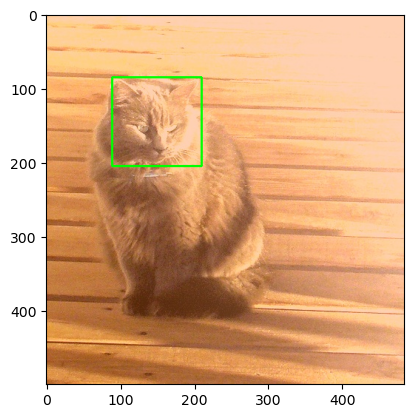

In [4]:
# image=image[ymin:ymin+(ymax-ymin),xmin:xmin+(xmax-xmin)]
plt.imshow(image)

In [34]:
la,xmin,ymin,xmax,ymax,image.shape

([0.47, 0.63, 0.49, 0.38], 162, 450, 515, 839, (1024, 721, 3))

In [185]:
xmid=int(0.47*721)
ymid=int(0.63*1024)
width=int(0.49*721)
height=int(0.38*1024)

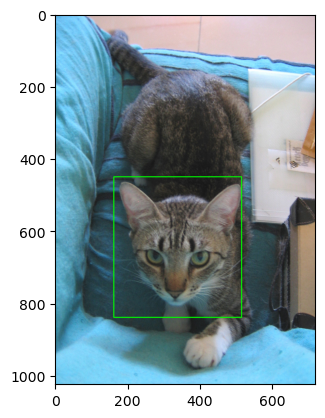

In [150]:
import matplotlib.pyplot as plt
plt.imshow(image)

In [131]:
image.shape

(1024, 721, 3)

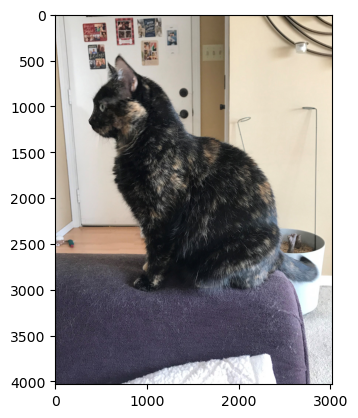

In [42]:
plt.imshow(image)

In [59]:
import albumentations as A
import cv2

# Declare an augmentation pipeline
transform = A.Compose([
    A.HorizontalFlip(p=0.5),
],bbox_params=A.BboxParams(format='coco', min_area=1024,label_fields=["image"]))

bboxes=[[50,50,200,200]]
labels=["cat"]

# Read an image with OpenCV and convert it to the RGB colorspace
image = cv2.imread("D:/cat_id/training1/house_1/Lilo Front profile brighter (2).jpg.jpg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Augment an image
transformed1 = transform(image=image,labels=labels,bboxes=bboxes)
transformed_image = transformed1["image"]

AssertionError: 

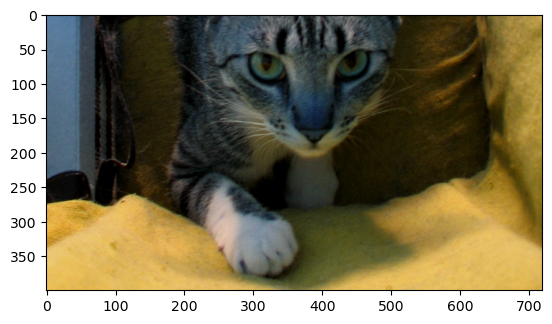

In [362]:
import albumentations as A
import cv2
import numpy as np

# Define the transformation pipeline
transform = A.Compose([
    A.Resize(512, 512),
    A.HorizontalFlip(p=1),
    # A.RandomCrop(width=400, height=300),
    A.RandomBrightnessContrast(p=0.5),
    # A.RandomSizedBBoxSafeCrop(height=200,width=100),
    # A.Transpose(p=1)
    A.Crop(x_min=0,y_min=600,x_max=720,y_max=1000,p=1),
    # A.VerticalFlip(p=0.5),
    # A.RandomRotate90(p=1),
    # A.RandomGridShuffle(p=0.5),
    # A.Normalize(),
    # zoom for front facing images
    # horizontal flip for side facing images
], bbox_params=A.BboxParams(format="yolo",label_fields=['labels']))

# Load and preprocess an example image and bounding box coordinates
la=pd.read_csv("D:/cat_id/data_structure/raw/train_data/yolo/labels/00000026_008.txt")
la=la.columns.values[0].split(" ")[1:]
la=[float(i) for i in la]
image = cv2.imread('D:/cat_id/data_structure/raw/train_data/yolo/images/00000026_008.jpg')
bboxes = [la] 
labels = ["cat"]  # Example class labels

# Apply the transformation pipeline to the image and bounding box coordinates
transformed = transform(image=image, bboxes=bboxes, labels=labels)

# Retrieve the transformed image and updated bounding box coordinates
transformed_image = transformed['image']
transformed_bboxes = transformed['bboxes']
transformed_labels = transformed['labels']

# Visualize the transformed image with bounding boxes
# for bbox, label in zip(transformed_bboxes, transformed_labels):
#     xmin, ymin, xmax, ymax = bbox
#     cv2.rectangle(transformed_image, (int(xmin), int(ymin)), (int(xmax), int(ymax)), (0, 255, 0), 2)
#     cv2.putText(transformed_image, str(label), (int(xmin), int(ymin) - 10),
#                 cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 255, 0), 2)

# Display the transformed image
plt.imshow( transformed_image)

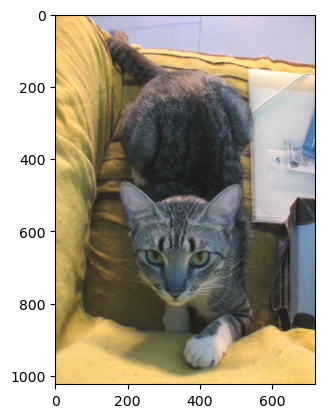

In [345]:
plt.imshow(image)

In [319]:
cv2.imwrite("transformed2.jpg",transformed_image)

True

In [349]:
transformed_bboxes[0]

(0.5307361111111111,
 0.5842666666666667,
 0.4906805555555555,
 0.8314666666666667)

In [251]:
xmin,ymin,xmax,ymax

(162.0, 185.0, 515.0, 574.0)

In [356]:
xmin1=int(((transformed_bboxes[0][0]*720)-(transformed_bboxes[0][2]*720)/2))
ymin1=int(((transformed_bboxes[0][1]*400)-(transformed_bboxes[0][3]*400)/2))
xmax1=int(((transformed_bboxes[0][0]*720)+(transformed_bboxes[0][2]*720)/2))
ymax1=int(((transformed_bboxes[0][1]*400)+(transformed_bboxes[0][3]*400)/2))

print(xmin1,ymin1,xmax1,ymax1)

205 0 558 239


In [267]:
xmin1 = max(0, xmin)
ymin1 = max(0, ymin)
xmax1 = min(500, xmax-0)
ymax1 = min(900, ymax-0)

In [334]:
xmin1=int(((transformed_bboxes[0][0]*400)-(transformed_bboxes[0][2]*400)/2))
ymin1=int(((transformed_bboxes[0][1]*300)-(transformed_bboxes[0][3]*300)/2))
xmax1=int(((transformed_bboxes[0][0]*400)+(transformed_bboxes[0][2]*400)/2))
ymax1=int(((transformed_bboxes[0][1]*300)+(transformed_bboxes[0][3]*300)/2))

print(xmin1,ymin1,xmax1,ymax1)

70 72 180 177


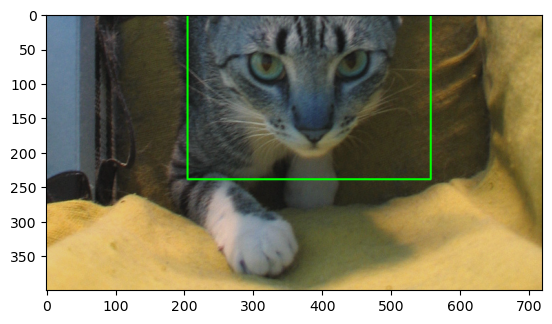

In [357]:
cv2.rectangle(transformed_image,(int(xmin1),int(ymin1)),(int(xmax1),int(ymax1)),(0,255,0),2)
plt.imshow(transformed_image)

In [194]:
print(0.53*721)
print(0.63*1024)
print(0.49*721)
print(0.38*1024)

382.13
645.12
353.29
389.12


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


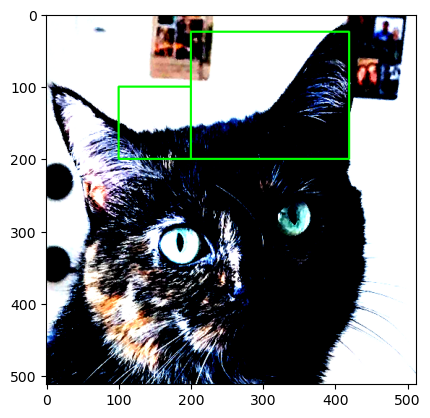

In [82]:
plt.imshow(cv2.rectangle(transformed_image,(int(xmin),int(ymin)),(200,200),(0,255,0),2))

In [177]:
a=cv2.imread("transformed.jpg")

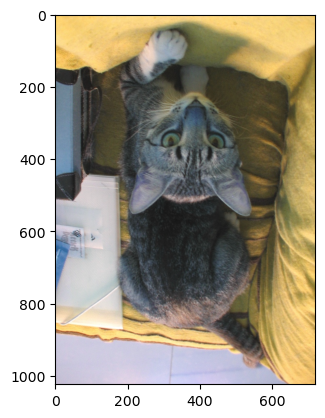

In [178]:
plt.imshow(a)

In [179]:
plt.imsave("transformed1.jpeg",transformed_image)

In [200]:
image.shape

(1024, 721, 3)

The history saving thread hit an unexpected error (OperationalError('database or disk is full')).History will not be written to the database.


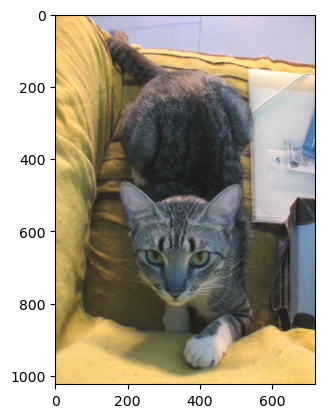

In [201]:
plt.imshow(image)

In [272]:
image.shape

(375, 500, 3)

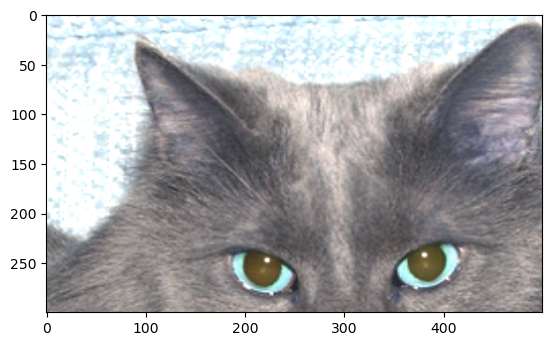

In [6]:
import albumentations as A
import cv2
import numpy as np
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

# Define the transformation pipeline
transform = A.Compose([
    A.Resize(512, 512),
    A.HorizontalFlip(p=1),
    # A.RandomCrop(width=400, height=300),
    A.RandomBrightnessContrast(p=0.5),
    # A.RandomSizedBBoxSafeCrop(height=200,width=100),
    # A.Transpose(p=1)
    A.Crop(x_min=0,y_min=0,x_max=500,y_max=300,p=1),
    # A.VerticalFlip(p=0.5),
    # A.RandomRotate90(p=1),
    # A.RandomGridShuffle(p=0.5),
    # A.Normalize(),
    # zoom for front facing images
    # horizontal flip for side facing images
], bbox_params=A.BboxParams(format="pascal_voc",label_fields=['labels']))

# Load and preprocess an example image and bounding box coordinates
# la=pd.read_csv("D:/cat_id/data_structure/raw/train_data/yolo/labels/00000026_008.txt")
la=pd.read_csv("D:/cat_id/data/raw/train_data/yolo/labels/00000017_007.txt")
la=la.columns.values[0].split(" ")[1:]
la=[float(i) for i in la]
image = cv2.imread('D:/cat_id/data/raw/train_data/yolo/images/00000017_007.jpg')
bboxes = [la] 
labels = ["cat"]  # Example class labels

xmin=int(((la[0]*image.shape[1])-(la[2]*image.shape[1])/2))
ymin=int(((la[1]*image.shape[0])-(la[3]*image.shape[0])/2))
xmax=int(((la[0]*image.shape[1])+(la[2]*image.shape[1])/2))
ymax=int(((la[1]*image.shape[0])+(la[3]*image.shape[0])/2))

image1=image[ymin:ymin+(ymax-ymin)+40,xmin:xmin+(xmax-xmin)+40]
n_xmin=0
n_ymin=0
n_xmax=image1.shape[1]-40
n_ymax=image1.shape[0]-40
n_bboxes=[[n_xmin,n_ymin,n_xmax,n_ymax]]

# Apply the transformation pipeline to the image and bounding box coordinates
transformed = transform(image=image1, bboxes=n_bboxes, labels=labels)

# Retrieve the transformed image and updated bounding box coordinates
transformed_image = transformed['image']
transformed_bboxes = transformed['bboxes']
transformed_labels = transformed['labels']

xmin1=int(transformed_bboxes[0][0])
ymin1=int(transformed_bboxes[0][1])
xmax1=int(transformed_bboxes[0][2])
ymax1=int(transformed_bboxes[0][3])

center_x=(xmin1 + xmax1) / 2
center_y=(ymin1+ymax1)/2
width=xmax1-xmin1
height=ymax1-ymin1
center_x_normalized = center_x / transformed_image.shape[1]
center_y_normalized = center_y / transformed_image.shape[0]
width_normalized = width / transformed_image.shape[1]
height_normalized=height/transformed_image.shape[0]
cv2.imwrite("albumentations/images/00026_008.jpg",transformed_image)

with open("albumentations/labels/00026_008.txt","w") as file:
    file.write(str(0))
    file.write(" ")
    file.write(str(np.round(center_x_normalized,decimals=2)))
    file.write(" ")
    file.write(str(np.round(center_y_normalized,decimals=2)))
    file.write(" ")
    file.write(str(np.round(width_normalized,decimals=2)))
    file.write(" ")
    file.write(str(np.round(height_normalized,decimals=2)))

# Visualize the transformed image with bounding boxes
# for bbox, label in zip(transformed_bboxes, transformed_labels):
#     xmin, ymin, xmax, ymax = bbox
#     cv2.rectangle(transformed_image, (int(xmin), int(ymin)), (int(xmax), int(ymax)), (0, 255, 0), 2)
#     cv2.putText(transformed_image, str(label), (int(xmin), int(ymin) - 10),
#                 cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 255, 0), 2)

# Display the transformed image
plt.imshow( transformed_image)

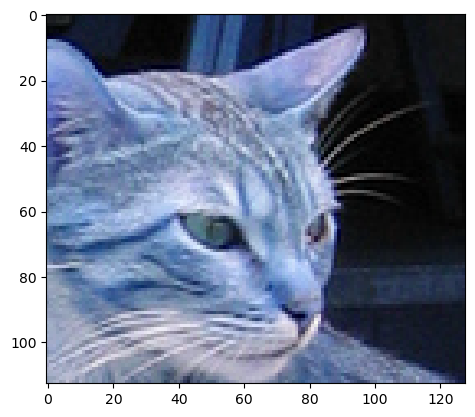

In [394]:
plt.imshow(image)

In [4]:
import torch
import os
import pandas as pd
import albumentations as A
import numpy as np
import matplotlib.pyplot as plt
import cv2
# model=torch.hub.load("ultralytics/yolov5","custom",path="C:/Users/uday.bijjala/Downloads/best_retrain_yolo.pt")
c=0
for i in os.listdir("D:/cat_id/data/raw/train_data/yolo/images"):
        

    # Define the transformation pipeline
    j=i.split(".")[0]
    transform = A.Compose([
        A.Resize(512, 512),
        # A.HorizontalFlip(p=1),
        # A.RandomCrop(width=400, height=300),
        # A.RandomBrightnessContrast(p=0.5),
        #   A.Blur(p=1),
        # A.HueSaturationValue(p=1),
        # A.GaussianBlur(p=1),
        # A.RandomSizedBBoxSafeCrop(height=200,width=100),
        # A.Transpose(p=1)
        A.Crop(x_min=0,y_min=200,x_max=500,y_max=500,p=1),
        # A.VerticalFlip(p=0.5),
        # A.RandomRotate90(p=1),
        # A.RandomGridShuffle(p=0.5),
        # A.Normalize(),
        # zoom for front facing images
        # horizontal flip for side facing images
    ], bbox_params=A.BboxParams(format="pascal_voc",label_fields=['labels']))

    # Load and preprocess an example image and bounding box coordinates
    # la=pd.read_csv("D:/cat_id/data_structure/raw/train_data/yolo/labels/00000026_008.txt")
    try:
        la=pd.read_csv(f"D:/cat_id/data/raw/train_data/yolo/labels/{j}.txt")
        
        la=la.columns.values[0].split(" ")[1:]
        la=[float(k) for k in la]
        image = cv2.imread(f"D:/cat_id/data/raw/train_data/yolo/images/{j}.jpg")
        # results=model(image)
        # eye_numbered=0
        # for i in results.xyxy[0]:
        #     cl=i[-1]
        #     if cl==0:
        #         eye_numbered=eye_numbered+1
        # if eye_numbered==2:
            
        bboxes = [la] 
        labels = ["cat"]  # Example class labels

        xmin=max(0,int(((la[0]*image.shape[1])-(la[2]*image.shape[1])/2)))
        ymin=max(0,int(((la[1]*image.shape[0])-(la[3]*image.shape[0])/2)))
        xmax=max(0,int(((la[0]*image.shape[1])+(la[2]*image.shape[1])/2)))
        ymax=max(0,int(((la[1]*image.shape[0])+(la[3]*image.shape[0])/2)))

        image1=image[ymin:ymin+(ymax-ymin)+40,xmin:xmin+(xmax-xmin)+40]
        n_xmin=0
        n_ymin=0
        n_xmax=image1.shape[1]-40
        n_ymax=image1.shape[0]-40
        n_bboxes=[[n_xmin,n_ymin,n_xmax,n_ymax]]

        # Apply the transformation pipeline to the image and bounding box coordinates
        transformed = transform(image=image1, bboxes=n_bboxes, labels=labels)

        # Retrieve the transformed image and updated bounding box coordinates
        transformed_image = transformed['image']
        transformed_bboxes = transformed['bboxes']
        transformed_labels = transformed['labels']

        xmin1=int(transformed_bboxes[0][0])
        ymin1=int(transformed_bboxes[0][1])
        xmax1=int(transformed_bboxes[0][2])
        ymax1=int(transformed_bboxes[0][3])

        center_x=(xmin1 + xmax1) / 2
        center_y=(ymin1+ymax1)/2
        width=xmax1-xmin1
        height=ymax1-ymin1
        center_x_normalized = center_x / transformed_image.shape[1]
        center_y_normalized = center_y / transformed_image.shape[0]
        width_normalized = width / transformed_image.shape[1]
        height_normalized=height/transformed_image.shape[0]
        cv2.imwrite(f"albumentations/images_remove_ears_2000/{j}_trans_ears_removal.jpg",transformed_image)

        with open(f"albumentations/labels_remove_ears_2000/{j}_trans_ears_removal.txt","w") as file:
            file.write(str(0))
            file.write(" ")
            file.write(str(np.round(center_x_normalized,decimals=2)))
            file.write(" ")
            file.write(str(np.round(center_y_normalized,decimals=2)))
            file.write(" ")
            file.write(str(np.round(width_normalized,decimals=2)))
            file.write(" ")
            file.write(str(np.round(height_normalized,decimals=2)))

        # Visualize the transformed image with bounding boxes
        # for bbox, label in zip(transformed_bboxes, transformed_labels):
        #     xmin, ymin, xmax, ymax = bbox
        #     cv2.rectangle(transformed_image, (int(xmin), int(ymin)), (int(xmax), int(ymax)), (0, 255, 0), 2)
        #     cv2.putText(transformed_image, str(label), (int(xmin), int(ymin) - 10),
        #                 cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 255, 0), 2)

        # Display the transformed image
        # plt.imshow( transformed_image)
        print(j)
        c=c+1
        print(c)
        if c==2000:
            break
    except:
        print(0,j)

0 00
0 000000
00000001_000
1
00000001_000__hue_saturation
2
00000001_005
3
00000001_008
4
00000001_011
5
00000001_011__hue_saturation
6
00000001_016
7
00000001_017
8
00000001_020
9
00000001_024
10
00000002_001
11
00000002_003
12
00000002_008
13
00000002_026
14
00000003_007
15
00000003_007__gaussianNoise
16
00000003_012
17
00000003_013
18
00000003_015
19
00000003_020
20
00000003_024
21
00000003_026
22
00000003_029
23
00000004_007
24
00000004_012
25
00000004_018
26
00000004_023
27
00000004_028
28
00000005_000
29
00000005_001
30
00000005_012
31
00000005_017
32
00000005_017__gaussianNoise
33
00000005_022
34
00000005_023
35
00000006_006
36
00000006_008
37
00000006_009
38
00000006_009__hue_saturation
39
00000006_011
40
00000006_016
41
00000006_022
42
00000006_025
43
00000006_029
44
00000007_000
45
00000007_002
46
00000007_002__hue_saturation
47
00000007_004
48
00000007_004__gaussianNoise
49
00000007_005
50
00000007_006
51
00000007_008
52
00000007_012
53
00000007_013
54
00000007_014
55
000000

In [5]:
import torch
import os
import pandas as pd
import albumentations as A
import numpy as np
import matplotlib.pyplot as plt
import cv2
model=torch.hub.load("ultralytics/yolov5","custom",path="C:/Users/uday.bijjala/Downloads/best_retrain_yolo.pt")
c=0
for i in os.listdir("D:/cat_id/data/raw/train_data/yolo/images"):
        

    # Define the transformation pipeline
    j=i.split(".")[0]
    transform = A.Compose([
        A.Resize(512, 512),
        A.HorizontalFlip(p=1),
        # A.RandomCrop(width=400, height=300),
        # A.RandomBrightnessContrast(p=0.5),
        #   A.Blur(p=1),
        # A.HueSaturationValue(p=1),
        # A.GaussianBlur(p=1),
        # A.RandomSizedBBoxSafeCrop(height=200,width=100),
        # A.Transpose(p=1)
        # A.Crop(x_min=0,y_min=200,x_max=500,y_max=500,p=1),
        # A.VerticalFlip(p=0.5),
        # A.RandomRotate90(p=1),
        # A.RandomGridShuffle(p=0.5),
        # A.Normalize(),
        # zoom for front facing images
        # horizontal flip for side facing images
    ], bbox_params=A.BboxParams(format="pascal_voc",label_fields=['labels']))

    # Load and preprocess an example image and bounding box coordinates
    # la=pd.read_csv("D:/cat_id/data_structure/raw/train_data/yolo/labels/00000026_008.txt")
    try:
        la=pd.read_csv(f"D:/cat_id/data/raw/train_data/yolo/labels/{j}.txt")
        la=la.columns.values[0].split(" ")[1:]
        la=[float(k) for k in la]
        image = cv2.imread(f"D:/cat_id/data/raw/train_data/yolo/images/{j}.jpg")
        results=model(image)
        eye_numbered=0
        for i in results.xyxy[0]:
            cl=i[-1]
            if cl==0:
                eye_numbered=eye_numbered+1
        if eye_numbered==1:
            
            bboxes = [la] 
            labels = ["cat"]  # Example class labels

            xmin=max(0,int(((la[0]*image.shape[1])-(la[2]*image.shape[1])/2)))
            ymin=max(0,int(((la[1]*image.shape[0])-(la[3]*image.shape[0])/2)))
            xmax=max(0,int(((la[0]*image.shape[1])+(la[2]*image.shape[1])/2)))
            ymax=max(0,int(((la[1]*image.shape[0])+(la[3]*image.shape[0])/2)))

            image1=image[ymin:ymin+(ymax-ymin)+40,xmin:xmin+(xmax-xmin)+40]
            n_xmin=0
            n_ymin=0
            n_xmax=image1.shape[1]-40
            n_ymax=image1.shape[0]-40
            n_bboxes=[[n_xmin,n_ymin,n_xmax,n_ymax]]

            # Apply the transformation pipeline to the image and bounding box coordinates
            transformed = transform(image=image1, bboxes=n_bboxes, labels=labels)

            # Retrieve the transformed image and updated bounding box coordinates
            transformed_image = transformed['image']
            transformed_bboxes = transformed['bboxes']
            transformed_labels = transformed['labels']

            xmin1=int(transformed_bboxes[0][0])
            ymin1=int(transformed_bboxes[0][1])
            xmax1=int(transformed_bboxes[0][2])
            ymax1=int(transformed_bboxes[0][3])

            center_x=(xmin1 + xmax1) / 2
            center_y=(ymin1+ymax1)/2
            width=xmax1-xmin1
            height=ymax1-ymin1
            center_x_normalized = center_x / transformed_image.shape[1]
            center_y_normalized = center_y / transformed_image.shape[0]
            width_normalized = width / transformed_image.shape[1]
            height_normalized=height/transformed_image.shape[0]
            cv2.imwrite(f"albumentations/images_flip/{j}_trans_flip.jpg",transformed_image)

            with open(f"albumentations/labels_flip/{j}_trans_flip.txt","w") as file:
                file.write(str(0))
                file.write(" ")
                file.write(str(np.round(center_x_normalized,decimals=2)))
                file.write(" ")
                file.write(str(np.round(center_y_normalized,decimals=2)))
                file.write(" ")
                file.write(str(np.round(width_normalized,decimals=2)))
                file.write(" ")
                file.write(str(np.round(height_normalized,decimals=2)))

            # Visualize the transformed image with bounding boxes
            # for bbox, label in zip(transformed_bboxes, transformed_labels):
            #     xmin, ymin, xmax, ymax = bbox
            #     cv2.rectangle(transformed_image, (int(xmin), int(ymin)), (int(xmax), int(ymax)), (0, 255, 0), 2)
            #     cv2.putText(transformed_image, str(label), (int(xmin), int(ymin) - 10),
            #                 cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 255, 0), 2)

            # Display the transformed image
            # plt.imshow( transformed_image)
            print(j)
            c=c+1
            print(c)
            # if c==20:
            #     break
    except:
        print(0,j)

Using cache found in C:\Users\uday.bijjala/.cache\torch\hub\ultralytics_yolov5_master
YOLOv5  2023-5-31 Python-3.10.11 torch-2.0.1+cpu CPU

Fusing layers... 
custom_YOLOv5s summary: 232 layers, 7251912 parameters, 0 gradients
Adding AutoShape... 


0 00
0 000000
00000004_007
1
00000007_022__gaussianNoise
2
00000009_023__hue_saturation
3
00000020_002
4
00000028_004__gaussianNoise
5
00000029_024__hue_saturation__gaussianNoise
6
00000030_006__hue_saturation
7
00000047_020__gaussianNoise
8
00000056_003__gaussianNoise
9
00000059_024
10
00000064_017__gaussianNoise
11
00000093_009__gaussianBlur
12
00000100_017
13
00000101_005__gaussianBlur
14
00000103_029
15
00000111_008
16
00000114_029__gaussianNoise
17
00000118_019__gaussianBlur
18
00000119_000
19
00000124_021__gaussianBlur
20
00000126_005
21
00000138_007__hue_saturation__gaussianNoise
22
00000152_019
23
00000156_002__gaussianBlur
24
00000159_024
25
00000165_020
26
00000169_028__gaussianBlur
27
00000171_013__gaussianNoise
28
00000183_010__gaussianNoise
29
00000183_027__gaussianBlur
30
00000188_003__gaussianBlur
31
00000188_013__gaussianBlur
32
00000209_004__gaussianNoise
33
00000215_004__gaussianNoise
34
00000218_009__gaussianNoise
35
00000226_025__gaussianBlur
36
00000231_028__gaussi

In [1]:
import torch
import os
import pandas as pd
import albumentations as A
import numpy as np
import matplotlib.pyplot as plt
import cv2
model=torch.hub.load("ultralytics/yolov5","custom",path="C:/Users/uday.bijjala/Downloads/best_retrain_yolo.pt")
c=0
for i in os.listdir("D:/cat_id/data/raw/train_data/yolo/images"):
        

    # Define the transformation pipeline
    j=i.split(".")[0]
    transform = A.Compose([
        A.Resize(512, 512),
        # A.HorizontalFlip(p=1),
        # A.RandomCrop(width=400, height=300),
        # A.RandomBrightnessContrast(p=0.5),
        #   A.Blur(p=1),
        # A.HueSaturationValue(p=1),
        # A.GaussianBlur(p=1),
        # A.RandomSizedBBoxSafeCrop(height=200,width=100),
        # A.Transpose(p=1)
        A.Crop(x_min=0,y_min=0,x_max=500,y_max=350,p=1),
        # A.VerticalFlip(p=0.5),
        # A.RandomRotate90(p=1),
        # A.RandomGridShuffle(p=0.5),
        # A.Normalize(),
        # zoom for front facing images
        # horizontal flip for side facing images
    ], bbox_params=A.BboxParams(format="pascal_voc",label_fields=['labels']))

    # Load and preprocess an example image and bounding box coordinates
    # la=pd.read_csv("D:/cat_id/data_structure/raw/train_data/yolo/labels/00000026_008.txt")
    try:
        la=pd.read_csv(f"D:/cat_id/data/raw/train_data/yolo/labels/{j}.txt")
        la=la.columns.values[0].split(" ")[1:]
        la=[float(k) for k in la]
        image = cv2.imread(f"D:/cat_id/data/raw/train_data/yolo/images/{j}.jpg")
        results=model(image)
        eye_numbered=0
        for i in results.xyxy[0]:
            cl=i[-1]
            if cl==0:
                eye_numbered=eye_numbered+1
            
        bboxes = [la] 
        labels = ["cat"]  # Example class labels

        xmin=max(0,int(((la[0]*image.shape[1])-(la[2]*image.shape[1])/2)))
        ymin=max(0,int(((la[1]*image.shape[0])-(la[3]*image.shape[0])/2)))
        xmax=max(0,int(((la[0]*image.shape[1])+(la[2]*image.shape[1])/2)))
        ymax=max(0,int(((la[1]*image.shape[0])+(la[3]*image.shape[0])/2)))

        image1=image[ymin:ymin+(ymax-ymin)+40,xmin:xmin+(xmax-xmin)+40]
        n_xmin=0
        n_ymin=0
        n_xmax=image1.shape[1]-40
        n_ymax=image1.shape[0]-40
        n_bboxes=[[n_xmin,n_ymin,n_xmax,n_ymax]]

        # Apply the transformation pipeline to the image and bounding box coordinates
        transformed = transform(image=image1, bboxes=n_bboxes, labels=labels)

        # Retrieve the transformed image and updated bounding box coordinates
        transformed_image = transformed['image']
        transformed_bboxes = transformed['bboxes']
        transformed_labels = transformed['labels']

        xmin1=int(transformed_bboxes[0][0])
        ymin1=int(transformed_bboxes[0][1])
        xmax1=int(transformed_bboxes[0][2])
        ymax1=int(transformed_bboxes[0][3])

        center_x=(xmin1 + xmax1) / 2
        center_y=(ymin1+ymax1)/2
        width=xmax1-xmin1
        height=ymax1-ymin1
        center_x_normalized = center_x / transformed_image.shape[1]
        center_y_normalized = center_y / transformed_image.shape[0]
        width_normalized = width / transformed_image.shape[1]
        height_normalized=height/transformed_image.shape[0]
        cv2.imwrite(f"albumentations/images_remove_chin/{j}_trans_chin_removal.jpg",transformed_image)

        with open(f"albumentations/labels_remove_chin/{j}_trans_chin_removal.txt","w") as file:
            file.write(str(0))
            file.write(" ")
            file.write(str(np.round(center_x_normalized,decimals=2)))
            file.write(" ")
            file.write(str(np.round(center_y_normalized,decimals=2)))
            file.write(" ")
            file.write(str(np.round(width_normalized,decimals=2)))
            file.write(" ")
            file.write(str(np.round(height_normalized,decimals=2)))

        # Visualize the transformed image with bounding boxes
        # for bbox, label in zip(transformed_bboxes, transformed_labels):
        #     xmin, ymin, xmax, ymax = bbox
        #     cv2.rectangle(transformed_image, (int(xmin), int(ymin)), (int(xmax), int(ymax)), (0, 255, 0), 2)
        #     cv2.putText(transformed_image, str(label), (int(xmin), int(ymin) - 10),
        #                 cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 255, 0), 2)

        # Display the transformed image
        # plt.imshow( transformed_image)
        print(j)
        c=c+1
        print(c)
            # if c==20:
            #     break
    except:
        print(0,j)

Using cache found in C:\Users\uday.bijjala/.cache\torch\hub\ultralytics_yolov5_master
YOLOv5  2023-5-31 Python-3.10.11 torch-2.0.1+cpu CPU

Fusing layers... 
custom_YOLOv5s summary: 232 layers, 7251912 parameters, 0 gradients
Adding AutoShape... 


0 00
0 000000
00000001_000
1
00000001_000__hue_saturation
2
00000001_005
3
00000001_008
4
00000001_011
5
00000001_011__hue_saturation
6
00000001_016
7
00000001_017
8
00000001_020
9
00000001_024
10
00000002_001
11
00000002_003
12
00000002_008
13
00000002_026
14
00000003_007
15
00000003_007__gaussianNoise
16
00000003_012
17
00000003_013
18
00000003_015
19
00000003_020
20
00000003_024
21
00000003_026
22
00000003_029
23
00000004_007
24
00000004_012
25
00000004_018
26
00000004_023
27
00000004_028
28
00000005_000
29
00000005_001
30
00000005_012
31
00000005_017
32
00000005_017__gaussianNoise
33
00000005_022
34
00000005_023
35
00000006_006
36
00000006_008
37
00000006_009
38
00000006_009__hue_saturation
39
00000006_011
40
00000006_016
41
00000006_022
42
00000006_025
43
00000006_029
44
00000007_000
45
00000007_002
46
00000007_002__hue_saturation
47
00000007_004
48
00000007_004__gaussianNoise
49
00000007_005
50
00000007_006
51
00000007_008
52
00000007_012
53
00000007_013
54
00000007_014
55
000000

In [3]:
import torch
import os
import pandas as pd
import albumentations as A
import numpy as np
import matplotlib.pyplot as plt
import cv2
# model=torch.hub.load("ultralytics/yolov5","custom",path="C:/Users/uday.bijjala/Downloads/best_retrain_yolo.pt")
c=0
for i in os.listdir("D:/cat_id/data/raw/train_data/yolo/images"):
        

    # Define the transformation pipeline
    j=i.split(".")[0]
    transform = A.Compose([
        A.Resize(512, 512),
        # A.HorizontalFlip(p=1),
        # A.RandomCrop(width=400, height=300),
        # A.RandomBrightnessContrast(p=0.5),
        #   A.Blur(p=1),
        # A.HueSaturationValue(p=1),
        # A.GaussianBlur(p=1),
        # A.RandomSizedBBoxSafeCrop(height=200,width=100),
        # A.Transpose(p=1)
        # A.Crop(x_min=0,y_min=200,x_max=500,y_max=500,p=1),
        # A.VerticalFlip(p=0.5),
        # A.RandomRotate90(p=1),
        # A.RandomGridShuffle(p=0.5),
        # A.Normalize(),
        # zoom for front facing images
        # horizontal flip for side facing images
    ], bbox_params=A.BboxParams(format="pascal_voc",label_fields=['labels']))

    # Load and preprocess an example image and bounding box coordinates
    # la=pd.read_csv("D:/cat_id/data_structure/raw/train_data/yolo/labels/00000026_008.txt")
    try:
        la=pd.read_csv(f"D:/cat_id/data/raw/train_data/yolo/labels/{j}.txt")
        la=la.columns.values[0].split(" ")[1:]
        la=[float(k) for k in la]
        image = cv2.imread(f"D:/cat_id/data/raw/train_data/yolo/images/{j}.jpg")
        # results=model(image)
        # eye_numbered=0
        # for i in results.xyxy[0]:
        #     cl=i[-1]
        #     if cl==0:
        #         eye_numbered=eye_numbered+1
            
        bboxes = [la] 
        labels = ["cat"]  # Example class labels

        xmin=max(0,int(((la[0]*image.shape[1])-(la[2]*image.shape[1])/2)))
        ymin=max(0,int(((la[1]*image.shape[0])-(la[3]*image.shape[0])/2)))
        xmax=max(0,int(((la[0]*image.shape[1])+(la[2]*image.shape[1])/2)))
        ymax=max(0,int(((la[1]*image.shape[0])+(la[3]*image.shape[0])/2)))

        image1=image[ymin:ymin+(ymax-ymin),xmin:xmin+(xmax-xmin)]
        n_xmin=0
        n_ymin=0
        n_xmax=image1.shape[1]
        n_ymax=image1.shape[0]
        n_bboxes=[[n_xmin,n_ymin,n_xmax,n_ymax]]

        # Apply the transformation pipeline to the image and bounding box coordinates
        transformed = transform(image=image1, bboxes=n_bboxes, labels=labels)

        # Retrieve the transformed image and updated bounding box coordinates
        transformed_image = transformed['image']
        transformed_bboxes = transformed['bboxes']
        transformed_labels = transformed['labels']

        xmin1=int(transformed_bboxes[0][0])
        ymin1=int(transformed_bboxes[0][1])
        xmax1=int(transformed_bboxes[0][2])
        ymax1=int(transformed_bboxes[0][3])

        center_x=(xmin1 + xmax1) / 2
        center_y=(ymin1+ymax1)/2
        width=xmax1-xmin1
        height=ymax1-ymin1
        center_x_normalized = center_x / transformed_image.shape[1]
        center_y_normalized = center_y / transformed_image.shape[0]
        width_normalized = width / transformed_image.shape[1]
        height_normalized=height/transformed_image.shape[0]
        cv2.imwrite(f"albumentations/images_face/{j}_trans_face.jpg",transformed_image)

        with open(f"albumentations/labels_face/{j}_trans_face.txt","w") as file:
            file.write(str(0))
            file.write(" ")
            file.write(str(np.round(center_x_normalized,decimals=2)))
            file.write(" ")
            file.write(str(np.round(center_y_normalized,decimals=2)))
            file.write(" ")
            file.write(str(np.round(width_normalized,decimals=2)))
            file.write(" ")
            file.write(str(np.round(height_normalized,decimals=2)))

        # Visualize the transformed image with bounding boxes
        # for bbox, label in zip(transformed_bboxes, transformed_labels):
        #     xmin, ymin, xmax, ymax = bbox
        #     cv2.rectangle(transformed_image, (int(xmin), int(ymin)), (int(xmax), int(ymax)), (0, 255, 0), 2)
        #     cv2.putText(transformed_image, str(label), (int(xmin), int(ymin) - 10),
        #                 cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 255, 0), 2)

        # Display the transformed image
        # plt.imshow( transformed_image)
        print(j)
        c=c+1
        print(c)
        # if c==20:
        #     break
    except:
        print(0,j)

0 00
0 000000
00000001_000
1
00000001_000__hue_saturation
2
00000001_005
3
00000001_008
4
00000001_011
5
00000001_011__hue_saturation
6
00000001_016
7
00000001_017
8
00000001_020
9
00000001_024
10
00000002_001
11
00000002_003
12
00000002_008
13
00000002_026
14
00000003_007
15
00000003_007__gaussianNoise
16
00000003_012
17
00000003_013
18
00000003_015
19
00000003_020
20
00000003_024
21
00000003_026
22
00000003_029
23
00000004_007
24
00000004_012
25
00000004_018
26
00000004_023
27
00000004_028
28
00000005_000
29
00000005_001
30
00000005_012
31
00000005_017
32
00000005_017__gaussianNoise
33
00000005_022
34
00000005_023
35
00000006_006
36
00000006_008
37
00000006_009
38
00000006_009__hue_saturation
39
00000006_011
40
00000006_016
41
00000006_022
42
00000006_025
43
00000006_029
44
00000007_000
45
00000007_002
46
00000007_002__hue_saturation
47
00000007_004
48
00000007_004__gaussianNoise
49
00000007_005
50
00000007_006
51
00000007_008
52
00000007_012
53
00000007_013
54
00000007_014
55
000000

_wsb_488x346_salle


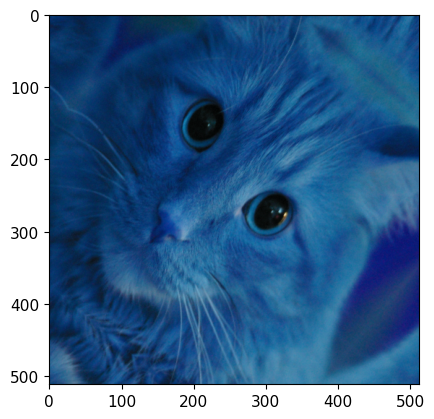

In [22]:
import matplotlib.pyplot as plt
import torch
import os
import pandas as pd
import albumentations as A
import numpy as np
import cv2
%matplotlib inline
for i in range(1):
        

    # Define the transformation pipeline
    # j=i.split(".")[0]
    transform = A.Compose([
        A.Resize(512, 512),
        # A.HorizontalFlip(p=1),
        # A.RandomCrop(width=400, height=300),
        # A.RandomBrightnessContrast(p=0.5),
        # A.GaussianBlur(),
        # A.Blur(p=1),
        A.Rotate(p=1,limit=[-40,-40]),
        # A.RandomSizedBBoxSafeCrop(height=200,width=100),
        # A.Transpose(p=1)
        # A.Crop(x_min=0,y_min=0,x_max=500,y_max=300,p=1),
        # A.VerticalFlip(p=0.5),
        # A.RandomRotate90(p=1),
        # A.RandomGridShuffle(p=0.5),
        # A.Normalize(),
        # zoom for front facing images
        # horizontal flip for side facing images
    ], bbox_params=A.BboxParams(format="pascal_voc",label_fields=['labels']))

    # Load and preprocess an example image and bounding box coordinates
    # la=pd.read_csv("D:/cat_id/data_structure/raw/train_data/yolo/labels/00000026_008.txt")
    try:
        la=pd.read_csv(f"D:/cat_id/data/raw/train_data/yolo/labels/00000016_022.txt")
        la=la.columns.values[0].split(" ")[1:]
        la=[float(k) for k in la]
        image = cv2.imread(f"D:/cat_id/data/raw/train_data/yolo/images/00000016_022.jpg")
        bboxes = [la] 
        labels = ["cat"]  # Example class labels

        xmin=max(0,int(((la[0]*image.shape[1])-(la[2]*image.shape[1])/2)))
        ymin=max(0,int(((la[1]*image.shape[0])-(la[3]*image.shape[0])/2)))
        xmax=max(0,int(((la[0]*image.shape[1])+(la[2]*image.shape[1])/2)))
        ymax=max(0,int(((la[1]*image.shape[0])+(la[3]*image.shape[0])/2)))

        image1=image[ymin:ymin+(ymax-ymin)+40,xmin:xmin+(xmax-xmin)+40]
        n_xmin=0
        n_ymin=0
        n_xmax=image1.shape[1]-40
        n_ymax=image1.shape[0]-40
        n_bboxes=[[n_xmin,n_ymin,n_xmax,n_ymax]]

        # Apply the transformation pipeline to the image and bounding box coordinates
        transformed = transform(image=image1, bboxes=n_bboxes, labels=labels)

        # Retrieve the transformed image and updated bounding box coordinates
        transformed_image = transformed['image']
        transformed_bboxes = transformed['bboxes']
        transformed_labels = transformed['labels']

        xmin1=int(transformed_bboxes[0][0])
        ymin1=int(transformed_bboxes[0][1])
        xmax1=int(transformed_bboxes[0][2])
        ymax1=int(transformed_bboxes[0][3])

        center_x=(xmin1 + xmax1) / 2
        center_y=(ymin1+ymax1)/2
        width=xmax1-xmin1
        height=ymax1-ymin1
        center_x_normalized = center_x / transformed_image.shape[1]
        center_y_normalized = center_y / transformed_image.shape[0]
        width_normalized = width / transformed_image.shape[1]
        height_normalized=height/transformed_image.shape[0]
        # cv2.imwrite(f"albumentations/images/{j}_trans.jpg",transformed_image)

        # with open(f"albumentations/labels/{j}_trans.txt","w") as file:
        #     file.write(str(0))
        #     file.write(" ")
        #     file.write(str(np.round(center_x_normalized,decimals=2)))
        #     file.write(" ")
        #     file.write(str(np.round(center_y_normalized,decimals=2)))
        #     file.write(" ")
        #     file.write(str(np.round(width_normalized,decimals=2)))
        #     file.write(" ")
        #     file.write(str(np.round(height_normalized,decimals=2)))

        # Visualize the transformed image with bounding boxes
        # for bbox, label in zip(transformed_bboxes, transformed_labels):
        #     xmin, ymin, xmax, ymax = bbox
        #     cv2.rectangle(transformed_image, (int(xmin), int(ymin)), (int(xmax), int(ymax)), (0, 255, 0), 2)
        #     cv2.putText(transformed_image, str(label), (int(xmin), int(ymin) - 10),
        #                 cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 255, 0), 2)

        # Display the transformed image
        plt.imshow( transformed_image)
        print(j)
        c=c+1
        if c==20:
            break
    except:
        print(0,j)

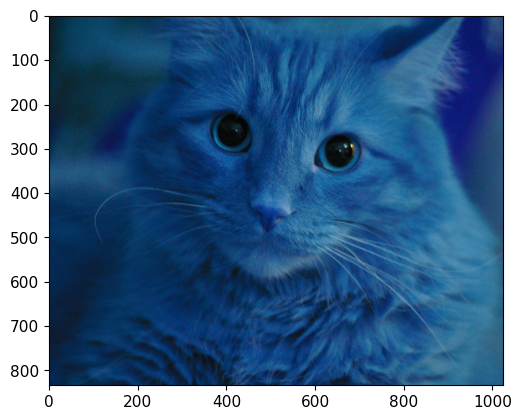

In [11]:
plt.imshow(image)

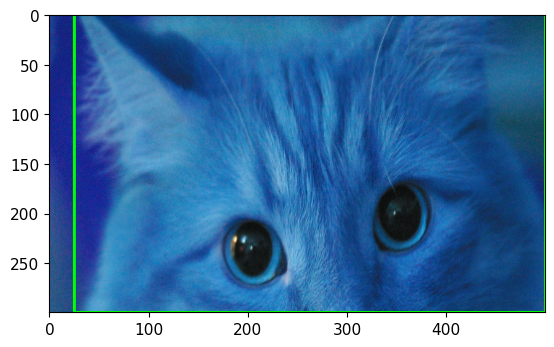

In [30]:
plt.imshow(cv2.rectangle(transformed_image,(25,0),(500,300),(0,255,0),2))

In [11]:
import albumentations as A
import cv2
import pandas as pd
import matplotlib.pyplot as plt

In [65]:
image.shape

(375, 500, 3)

In [66]:
image1.shape,la

((0, 225, 3), [0.74, 0.27, 0.38, 0.58])

In [72]:
xmin,ymin,xmax,ymax

(275, 0, 465, 210)

In [19]:
0.27*375-(0.58)*375/2

-7.499999999999986

In [21]:
!pip install pybboxes
import pybboxes as pbx

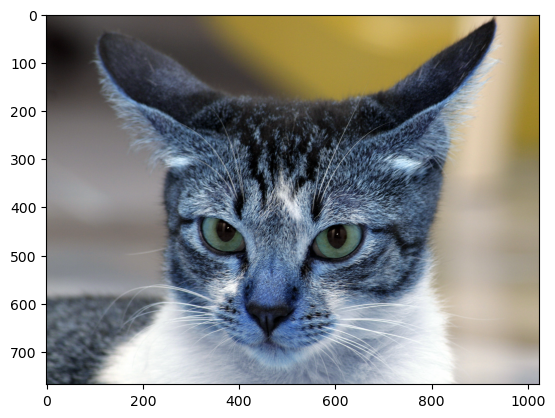

In [53]:
plt.imshow(image)

In [39]:
yolo_bbox1 = la
W, H = 500,375 # WxH of the image
pbx.convert_bbox(yolo_bbox1, from_type="yolo", to_type="voc", image_size=(W, H))

(275, -7, 465, 210)

In [25]:
la

[0.74, 0.27, 0.38, 0.58]

In [40]:
0.27*375-(0.58*375)/2

-7.499999999999986

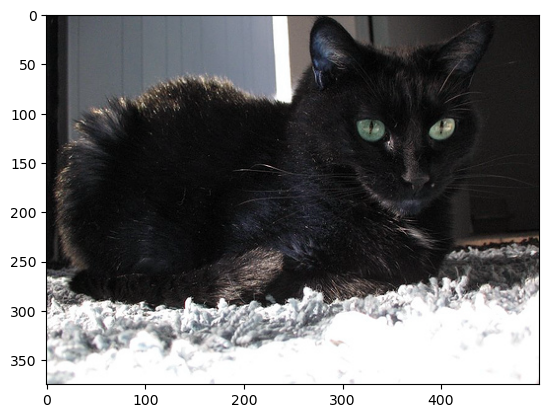

In [41]:
plt.imshow(image)

In [54]:
cv2.rectangle(image,(30, -11),(952, 794),(0,255,0),2)

array([[[ 67,  53,  54],
        [ 65,  52,  54],
        [ 67,  54,  56],
        ...,
        [185, 156,  87],
        [184, 158,  88],
        [183, 158,  88]],

       [[ 60,  52,  52],
        [ 59,  51,  51],
        [ 62,  54,  54],
        ...,
        [184, 157,  83],
        [183, 158,  84],
        [183, 158,  84]],

       [[ 56,  52,  51],
        [ 54,  50,  49],
        [ 56,  52,  51],
        ...,
        [183, 157,  81],
        [184, 158,  81],
        [185, 159,  82]],

       ...,

       [[ 48,  57,  71],
        [ 48,  57,  71],
        [ 49,  58,  72],
        ...,
        [173, 172, 182],
        [172, 171, 181],
        [172, 171, 181]],

       [[ 42,  54,  64],
        [ 44,  56,  68],
        [ 48,  57,  70],
        ...,
        [174, 173, 183],
        [173, 171, 183],
        [171, 171, 183]],

       [[ 35,  49,  55],
        [ 39,  52,  60],
        [ 42,  54,  66],
        ...,
        [173, 171, 183],
        [173, 171, 183],
        [171, 171, 183]]

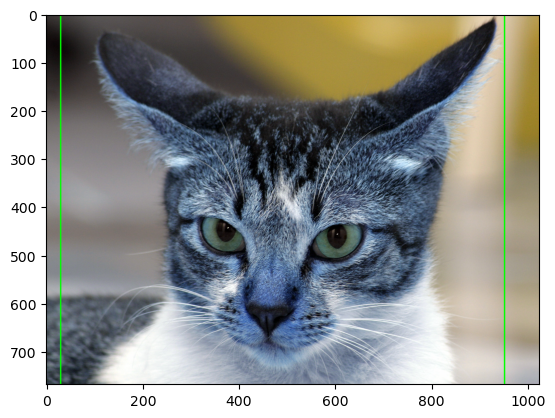

In [55]:
plt.imshow(image)

In [69]:
max(0,ymin)

0

In [1]:
import torch
model=torch.hub.load("ultralytics/yolov5","custom",path="D:/cat_id/yolov5nano-main/v2/exp9 (1)/exp9/weights/best.pt")
# img="D:/cat_id/training/house_5705/83c9bdbb-4338-4ee2-9396-4fd444d46708.jpg"
# results=model("D:/cat_id/110 camera height - 10 degree angle.mp4")

Using cache found in C:\Users\uday.bijjala/.cache\torch\hub\ultralytics_yolov5_master
YOLOv5  2023-5-31 Python-3.10.11 torch-2.0.1+cpu CPU

Fusing layers... 
YOLOv5n summary: 157 layers, 1761871 parameters, 0 gradients, 4.1 GFLOPs
Adding AutoShape... 


In [10]:
import cv2
video = cv2.VideoCapture("D:/cat_id/yolo_pipeline/yolo_pipeline/input/side approach.mp4")
c=0
while True:
    # Read the next frame
    c=c+1
    ret, frame = video.read() 
    if not ret: 
        break 
    
    results=model(frame)
    if results.xyxy[0].tolist()==[]:
        continue
    res=results
    fra=frame

In [14]:
res.xyxy[0][0].tolist()

[1555.1251220703125, 0.0, 1920.0, 615.290771484375, 0.5206283926963806, 0.0]

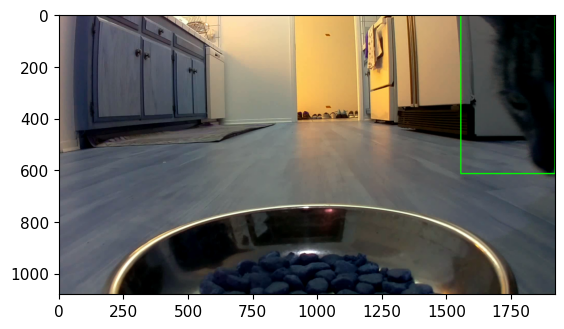

In [16]:
import matplotlib.pyplot as plt
%matplotlib inline 

plt.imshow(cv2.rectangle(fra,(1555,0),(1920,615),(0,255,0),3))

In [6]:
if results.xyxy[0].tolist()==[]:
    print(1)

1


In [2]:
results.xyxy[0][0].tolist()[-2]

0.7062654495239258

In [118]:
for i in results.xyxy[0]:
    cl=i[-1]
    if cl==0:
        print(1)

1
1


In [33]:
results.xyxy

[tensor([[6.69206e+02, 9.64456e+02, 2.27310e+03, 2.50915e+03, 9.26685e-01, 2.00000e+00],
         [1.60563e+03, 1.79377e+03, 1.81610e+03, 1.99579e+03, 6.92779e-01, 0.00000e+00],
         [1.10037e+03, 1.81937e+03, 1.29546e+03, 2.00953e+03, 6.70369e-01, 0.00000e+00],
         [1.27914e+03, 2.32505e+03, 1.49524e+03, 2.53485e+03, 5.49758e-01, 1.00000e+00]])]

In [13]:
import torch
import torchvision.models as models
from ptflops import get_model_complexity_info
# model=torch.hub.load("ultralytics/yolov5","custom",path="C:/Users/uday.bijjala/cat_visual_id_1/yolov5/runs/train/exp/weights/best.pt")
model=torch.hub.load("ultralytics/yolov5","custom",path="yolov5s.pt")
# model=torch.hub.load("ultralytics/yolov5","custom",path="D:/cat_id/yolov5nano-main/v2/exp9 (1)/exp9/weights/best.pt")

macs, params = get_model_complexity_info(model, (3, 224, 224), as_strings=True,
                                          print_per_layer_stat=True, verbose=True)
print('{:<30}  {:<8}'.format('Computational complexity: ', macs))
print('{:<30}  {:<8}'.format('Number of parameters: ', params))

Using cache found in C:\Users\uday.bijjala/.cache\torch\hub\ultralytics_yolov5_master
YOLOv5  2023-5-31 Python-3.10.11 torch-2.0.1+cpu CPU

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 


AutoShape(
  0, 0.000% Params, 1.01 GMac, 100.000% MACs, 
  (model): DetectMultiBackend(
    0, 0.000% Params, 1.01 GMac, 100.000% MACs, 
    (model): DetectionModel(
      0, 0.000% Params, 1.01 GMac, 100.000% MACs, 
      (model): Sequential(
        0, 0.000% Params, 1.01 GMac, 100.000% MACs, 
        (0): Conv(
          0, 0.000% Params, 43.75 MMac, 4.332% MACs, 
          (conv): Conv2d(0, 0.000% Params, 43.75 MMac, 4.332% MACs, 3, 32, kernel_size=(6, 6), stride=(2, 2), padding=(2, 2))
          (act): SiLU(0, 0.000% Params, 0.0 Mac, 0.000% MACs, inplace=True)
        )
        (1): Conv(
          0, 0.000% Params, 58.0 MMac, 5.743% MACs, 
          (conv): Conv2d(0, 0.000% Params, 58.0 MMac, 5.743% MACs, 32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
          (act): SiLU(0, 0.000% Params, 0.0 Mac, 0.000% MACs, inplace=True)
        )
        (2): C3(
          0, 0.000% Params, 58.4 MMac, 5.783% MACs, 
          (cv1): Conv(
            0, 0.000% Params, 6.52 MMac,

In [42]:
model=torch.hub.load("ultralytics/yolov5","custom",path="C:/Users/uday.bijjala/cat_visual_id_1/yolov5/runs/train/exp/weights/best.pt")
img="D:/cat_id/training/house_5705/83c9bdbb-4338-4ee2-9396-4fd444d46708.jpg"
results=model(img)

Using cache found in C:\Users\uday.bijjala/.cache\torch\hub\ultralytics_yolov5_master
YOLOv5  2023-5-16 Python-3.10.11 torch-2.0.1+cpu CPU

Fusing layers... 


requirements: C:\Users\uday.bijjala\AppData\Roaming\Python\Python310\site-packages\requirements.txt not found, check failed.


custom_YOLOv5s summary: 232 layers, 7249215 parameters, 0 gradients
Adding AutoShape... 


In [43]:
l=results.xyxy[0][0].tolist()
xmin=int(l[0])
ymin=int(l[1])
xmax=int(l[2])
ymax=int(l[3])

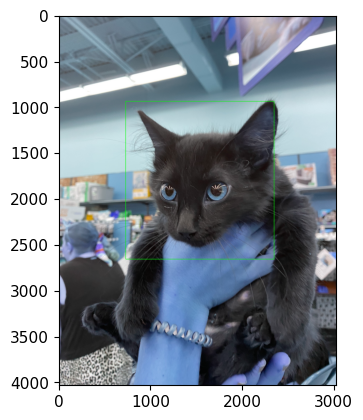

In [46]:
image=cv2.imread(img)
plt.imshow(cv2.rectangle(image,(xmin,ymin),(xmax,ymax),(0,255,0),3))

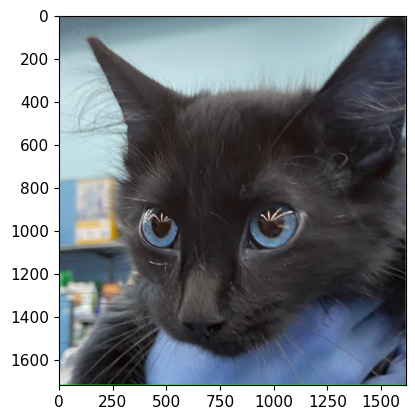

In [50]:
plt.imshow(image[ymin:ymax,xmin:xmax])

In [51]:
video=cv2.VideoCapture("D:/cat_id/vids/old_vids/Sep_23_2021_18_36_02.592663_5_fauna.mp4")  
a="Sep_23_2021_18_36_02.592663_5_fauna"
ma=0 
while True:
    # Read the next frame
    ret, frame = video.read()
    if not ret:
        break
    results=model(frame)
    l=results.xyxy[0].tolist()
    if l==[]:
        continue
    else:
        l=l[0]
    if l[-2]>0.8:
        img.append(frame)
        img.append(l)


        

In [2]:
import torch
model=torch.hub.load("ultralytics/yolov5","custom",path="C:/Users/uday.bijjala/cat_visual_id_1/yolov5/runs/train/exp/weights/best.pt")
img="D:/cat_id/training/house_5705/83c9bdbb-4338-4ee2-9396-4fd444d46708.jpg"
results=model(img)
results.xyxy[0]

Using cache found in C:\Users\uday.bijjala/.cache\torch\hub\ultralytics_yolov5_master
YOLOv5  2023-5-16 Python-3.10.11 torch-2.0.1+cpu CPU

Fusing layers... 


requirements: C:\Users\uday.bijjala\AppData\Roaming\Python\Python310\site-packages\requirements.txt not found, check failed.


custom_YOLOv5s summary: 232 layers, 7249215 parameters, 0 gradients
Adding AutoShape... 


tensor([[7.25302e+02, 9.40407e+02, 2.33955e+03, 2.66067e+03, 8.86916e-01, 0.00000e+00]])

In [27]:
model=torch.hub.load("ultralytics/yolov5","custom",path="C:/Users/uday.bijjala/cat_visual_id_1/yolov5/yolov5s.pt")
img="C:/Users/uday.bijjala/Downloads/cat_with_bowl1.jpg"
results=model(img)

Using cache found in C:\Users\uday.bijjala/.cache\torch\hub\ultralytics_yolov5_master
YOLOv5  2023-5-31 Python-3.10.11 torch-2.0.1+cpu CPU

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 


In [14]:
results.xyxy[0][0].tolist()

[87.4372329711914,
 220.48780822753906,
 342.02685546875,
 317.3166198730469,
 0.44197848439216614,
 45.0]

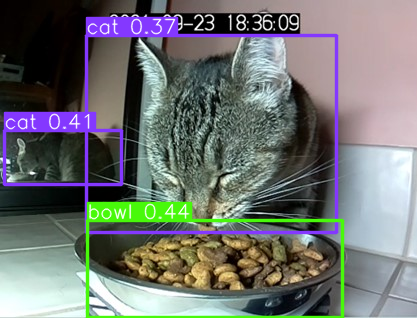

In [12]:
results.show()

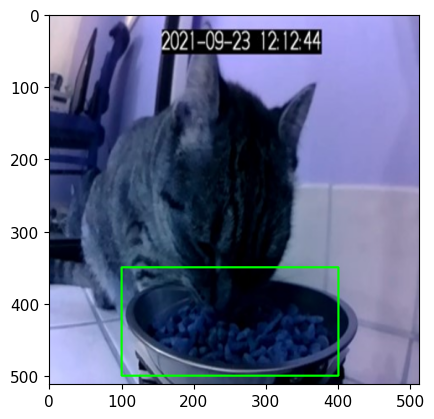

In [29]:
import albumentations as A
transform = A.Compose([
        A.Resize(512, 512),
    ], bbox_params=A.BboxParams(format="pascal_voc",label_fields=['labels']))

xmin=int(results.xyxy[0][0].tolist()[0])
ymin=int(results.xyxy[0][0].tolist()[1])
xmax=int(results.xyxy[0][0].tolist()[2])
ymax=int(results.xyxy[0][0].tolist()[3])
labels=["cat"]
n_bboxes=[[xmin,ymin,xmax,ymax]]
transformed = transform(image=imag, bboxes=n_bboxes, labels=labels)
transformed_image=transformed["image"]
transformed_bboxes=transformed["bboxes"]
xmin1=int(transformed_bboxes[0][0])
ymin1=int(transformed_bboxes[0][1])
xmax1=int(transformed_bboxes[0][2])
ymax1=int(transformed_bboxes[0][3])
cv2.rectangle(transformed_image,(100,350),(400,500),(0,255,0),2)
plt.imshow(transformed_image)

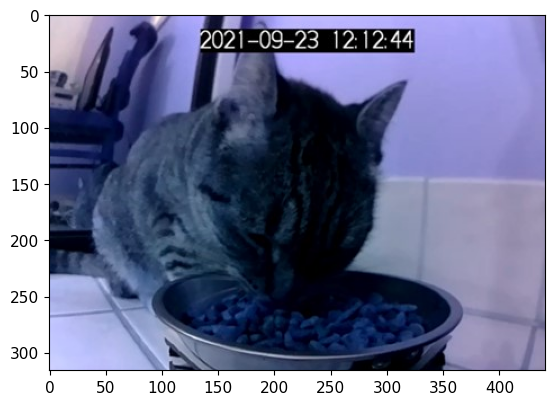

In [28]:
import cv2
import matplotlib.pyplot as plt
%matplotlib inline
imag=cv2.imread(img)
plt.imshow(imag)

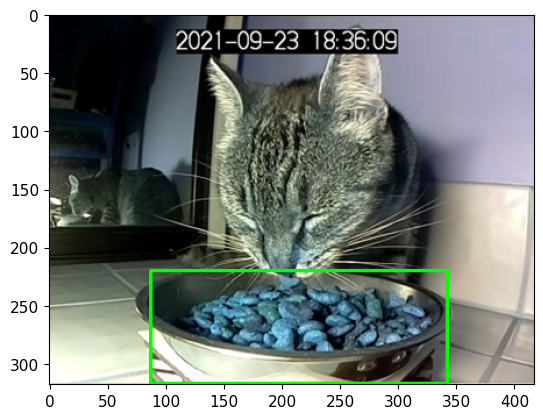

In [18]:
plt.imshow(cv2.rectangle(imag,(xmin,ymin),(xmax,ymax),(0,255,0),2))

In [1]:
import json
import requests
import os
import shutil
import zipfile

annotation_url = 'http://images.cocodataset.org/annotations/annotations_trainval2017.zip'
annotation_dir = 'D:/cat_id/coco'
annotation_zip_file = os.path.join(annotation_dir, 'annotations_trainval2017.zip')
# response = requests.get(annotation_url, stream=True)
# with open(annotation_zip_file, 'wb') as file:
#     shutil.copyfileobj(response.raw, file)
# with zipfile.ZipFile(annotation_zip_file, 'r') as zip_ref:
#     zip_ref.extractall(annotation_dir)

coco_annotation_file = os.path.join(annotation_dir, 'annotations/instances_train2017.json')
with open(coco_annotation_file, 'r') as file:
    coco_data = json.load(file)


category_name = 'bowl'
categories = coco_data["categories"]
category_id = None

for category in categories:
    if category['name'] == category_name:
        category_id = category['id']
        break

annotations = coco_data['annotations']
filtered_annotations = [ann for ann in annotations if ann['category_id'] == category_id]

# Get the image IDs for the filtered annotations
image_ids = [ann['image_id'] for ann in filtered_annotations]

# Retrieve image information for the filtered image IDs
images = coco_data['images']
filtered_images = [img for img in images if img['id'] in image_ids]


In [23]:
import fiftyone as fo
import fiftyone.zoo as foz 

# dataset = foz.load_zoo_dataset(
#     "coco-2017",
#     split="validation",
#     max_samples=1000,
#     shuffle=True,
# )

# session = fo.launch_app(dataset)

dataset = foz.load_zoo_dataset(
    "coco-2017",
    split="train",
    label_types=["detections"],
    classes=["bowl"],
    max_samples=1000,
)

session = fo.launch_app(dataset)

session.dataset=dataset


Found annotations at 'C:\Users\uday.bijjala\fiftyone\coco-2017\raw\instances_train2017.json'


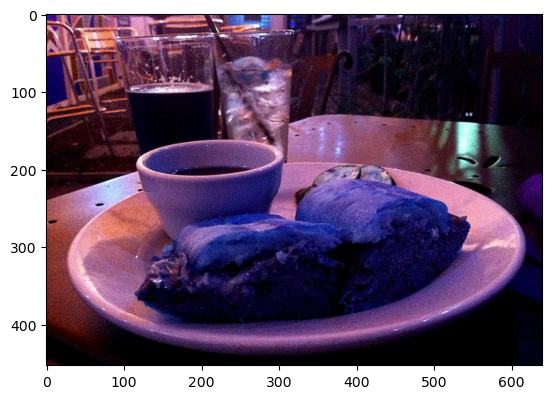

In [21]:
import cv2
import matplotlib.pyplot as plt
%matplotlib inline
bbox=[108,254,277,145]
img="D:/cat_id/fiftyone/coco-2017/validation/data/000000551822.jpg"
imag=cv2.imread(img)
plt.imshow(imag)

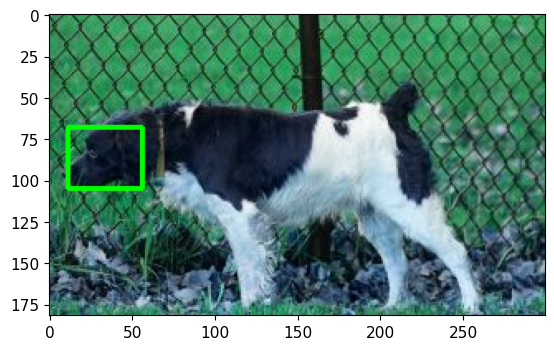

In [17]:
import matplotlib.pyplot as plt
%matplotlib inline
import cv2
imag=cv2.imread('D:/cat_id/dog_images/dog_images/Welsh Springer Spaniel/64509071_2.jpg')
plt.imshow(cv2.rectangle(imag,(11,68),(56,105),(0,255,0),2))

In [77]:
import os
import shutil 
for i in os.listdir("D:/cat_id/yolo v6/new_inference_data/side-facing/side-facing/real dog side profile/real dog side profile"):
    shutil.copy(f"D:/cat_id/yolo v6/new_inference_data/side-facing/side-facing/real dog side profile/real dog side profile/{i}",f"D:/cat_id/yolo v6/new_inference_data/side_face_all/dog_{i}")

In [85]:
l=[]
c=0
for i in os.listdir("D:/cat_id/val_images/"):
    l.append([])
    if "cat" in i:
        l[c].append(0)
        l[c].append(i.split(".")[0])
    else:
        l[c].append(1)
        l[c].append(i.split(".")[0])
    c=c+1

In [86]:
pd.DataFrame(l,columns=["o_class","image_name"]).to_csv("D:/cat_id/yolo v6/new_inference_data/original.csv")

In [87]:
l1=[]
c=0
for i in os.listdir("D:/cat_id/yolo v6/new_inference_data/labels"):
    l=pd.read_csv(f"D:/cat_id/yolo v6/new_inference_data/labels/{i}",header=None,sep=" ")
    if len(l)==1:
        l=l.iloc[0].values
        l1.append([])
        if l[0]==0:
            l1[c].append(0)
            l1[c].append(i.split(".")[0])
        else:
            l1[c].append(1)
            l1[c].append(i.split(".")[0])
        c=c+1
    else:
        l1.append([])
        l1[c].append(2)
        l1[c].append(i.split(".")[0])
        c=c+1
        

In [88]:
df1=pd.DataFrame(l1,columns=["p_class","image_name"])
df=pd.read_csv("D:/cat_id/yolo v6/new_inference_data/original.csv")

In [89]:
df.drop("Unnamed: 0",axis=1,inplace=True)

In [90]:
res=pd.merge(left=df,right=df1,on="image_name",how="left")

In [91]:
res=res.fillna("3")

In [92]:
d={1:"dog",0:"cat","3":"other","2":"multi-face"}
res["o_class"]=res["o_class"].apply(lambda x:d[x])

In [93]:
d={1:"dog",0:"cat","3":"other",2:"multi-face"}
res["p_class"]=res["p_class"].apply(lambda x:d[x])

In [94]:
from sklearn.metrics import classification_report,confusion_matrix

print(classification_report(res["o_class"],res["p_class"]))
print(confusion_matrix(res["o_class"],res["p_class"]))

              precision    recall  f1-score   support

         cat       1.00      0.89      0.94      3126
         dog       0.98      0.91      0.94      3125
  multi-face       0.00      0.00      0.00         0
       other       0.00      0.00      0.00         0

    accuracy                           0.90      6251
   macro avg       0.49      0.45      0.47      6251
weighted avg       0.99      0.90      0.94      6251

[[2782   65  113  166]
 [   1 2846   62  216]
 [   0    0    0    0]
 [   0    0    0    0]]


c:\Users\uday.bijjala\Miniconda3\envs\npp-pet-id_1-dev\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\uday.bijjala\Miniconda3\envs\npp-pet-id_1-dev\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\uday.bijjala\Miniconda3\envs\npp-pet-id_1-dev\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, le

In [60]:
res["category_1"]=pd.to_numeric(res["category_1"])

In [65]:
cat_as_other=res[(res["category_1"]==2) & (res["category"]==0)]["image_name"].values
dog_as_other=res[(res["category_1"]==2) & (res["category"]==1)]["image_name"].values

In [103]:
cat_as_dogs=res[(res["p_class"]=="dog") & (res["o_class"]=="cat")]["image_name"].values
dog_as_cats=res[(res["p_class"]=="cat") & (res["o_class"]=="dog")]["image_name"].values

In [99]:
l2=[]
for i in os.listdir("D:/cat_id/val_images"):
    l2.append(i)



In [106]:
import shutil
for i in dog_as_cats:
    for j in l2:
        if i in j:
            s=j
    shutil.copy(f"D:/cat_id/val_images/{s}",f"D:/cat_id/yolo v6/new_inference_data/dog_as_cats/")

In [104]:
len(cat_as_dogs)

65

In [75]:
len(dog_as_other)

216

In [95]:
res.to_excel("D:/cat_id/yolo v6/new_inference_data/final_results.xlsx")

C:\Users\uday.bijjala\AppData\Local\Temp\ipykernel_28488\1554542387.py:1: UserWarning: Pandas requires version '1.4.3' or newer of 'xlsxwriter' (version '1.3.8' currently installed).
  res.to_excel("D:/cat_id/yolo v6/new_inference_data/final_results.xlsx")


In [111]:
import onnx
import onnx_tf

def convert_yolov6s_pt_to_tflite(weights_path):
  model = onnx.load(weights_path)
  onnx_tf.convert(model, 'yolo_v6s.tflite')


convert_yolov6s_pt_to_tflite('D:/cat_id/yolo v6/v1/exp5/exp5/weights/best_ckpt.pt')

ImportError: This version of TensorFlow Probability requires TensorFlow version >= 2.12; Detected an installation of version 2.8.0. Please upgrade TensorFlow to proceed.

In [2]:
imag=cv2.imread("D:/cat_id/yolo v6/v1/yolo_v6_misclassification_analysis/cat_as_dogs/Bengal_173.jpg")

TypeError: Image data of dtype object cannot be converted to float

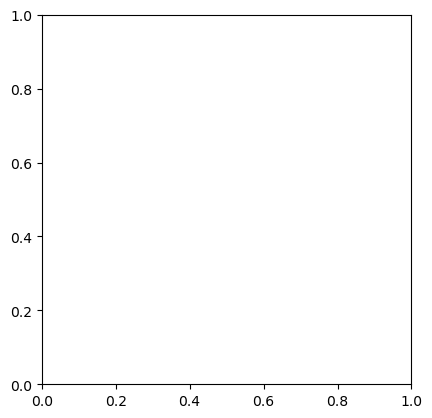

In [3]:
plt.imshow(imag)

In [122]:
imag1=cv2.imread("D:/cat_id/test/yolo_test/images/Cats_Test2964.jpg")

In [126]:
if imag1 is None:
    print(1)

1


In [2]:
import os 
l=[]
for i in os.listdir("D:/cat_id/dog_images_v3/latest_dog_images/all_images_gt_40/"):
    l.append(i)

In [6]:
import pandas as pd
df=pd.DataFrame(data=l,columns=["images"])

In [7]:
df.to_csv("D:/cat_id/dog_images_v3/latest_dog_images/dog_images.csv")

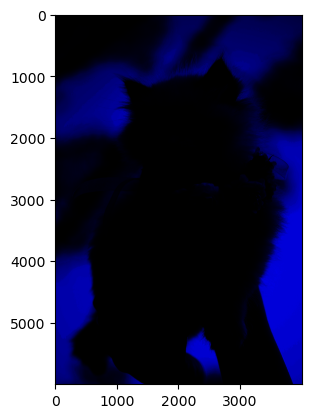

In [12]:
import cv2 
import matplotlib.pyplot as plt 
import numpy as np 
img=cv2.imread("D:/cat_id/RedditImageScraper-main_temp/RedditImageScraper-main/images/kitten1/kitten4.jpg")
# img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
arr=img*np.array([0.00,0.0,1])
arr2=(255*arr/arr.max()).astype(np.uint8)
gamma=10
gamma_img=np.array(255*(arr2/255)**gamma,dtype="uint8")
plt.imshow(gamma_img)

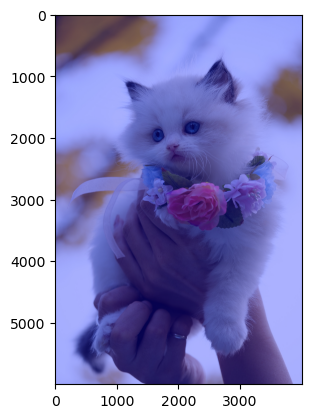

In [13]:
from PIL import Image

# Load the image
image = Image.open("D:/cat_id/RedditImageScraper-main_temp/RedditImageScraper-main/images/kitten1/kitten4.jpg")

# Apply a blue tint by manipulating the RGB channels
blue_tinted_image = image.copy()
blue_tinted_image = Image.blend(blue_tinted_image, Image.new("RGB", image.size, (0, 0, 255)), alpha=0.3)

# Save the blue-tinted image
# blue_tinted_image.save("path/to/blue_tinted_night_vision_photo.jpg")

plt.imshow(blue_tinted_image)


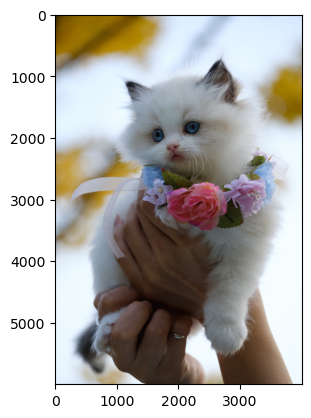

In [14]:
img=cv2.imread("D:/cat_id/RedditImageScraper-main_temp/RedditImageScraper-main/images/kitten1/kitten4.jpg")
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)

In [18]:
import shutil 
import os 

c=0
for i in os.listdir("D:/cat_id/new_adult_toy_baby/baby/baby/images"):
    shutil.copy(f"D:/cat_id/new_adult_toy_baby/baby/baby/images/{i}",f"D:/cat_id/new_adult_toy_baby/all_images/baby_{c}.jpg")
    c=c+1

In [19]:
import shutil 
import os 

c=0
for i in os.listdir("D:/cat_id/new_adult_toy_baby/baby/baby/labels"):
    shutil.copy(f"D:/cat_id/new_adult_toy_baby/baby/baby/labels/{i}",f"D:/cat_id/new_adult_toy_baby/all_labels/baby_{c}.txt")
    c=c+1

In [10]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the input image
image = cv2.imread("D:/cat_id/RedditImageScraper-main_temp/RedditImageScraper-main/images/kitten1/kitten4.jpg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Get the image center coordinates
height, width, _ = image.shape
center_x, center_y = width // 2, height // 2

# Set the fisheye parameters
focal_length = width
K = np.eye(3)
D = np.zeros(4)
R = np.eye(3)
P = np.eye(3)
size = (640, 480)

# Generate the fisheye map
map_x, map_y = cv2.fisheye.initUndistortRectifyMap(K,D,R,P, size=(640,480), m1type=cv2.CV_16SC2)
fisheye_image = cv2.remap(image, map_x, map_y, interpolation=cv2.INTER_LINEAR, borderMode=cv2.BORDER_CONSTANT)

# Save the fisheye lens image
# cv2.imwrite("path/to/fisheye_image.jpg", fisheye_image)


In [12]:
D

array([0., 0., 0., 0.])

In [65]:
import cv2

# Load the image using OpenCV
image = cv2.imread("D:/cat_id/RedditImageScraper-main_temp/RedditImageScraper-main/images/kitten1/kitten14.jpg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Convert the image to the YUV color space
yuv_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)

# Extract the Y channel (luminance) from the YUV image
y_channel = yuv_image[:, :, 0]

# Calculate the average luminosity value of the image
average_luminosity = y_channel.mean()

print("Average Luminosity:", average_luminosity)

Average Luminosity: 161.47803901192236


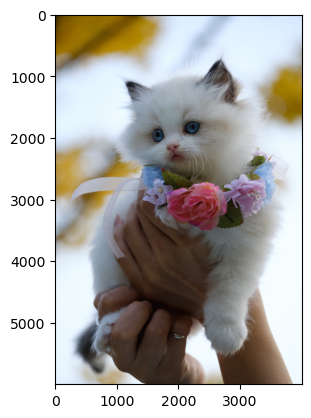

In [49]:
import matplotlib.pyplot as plt 
plt.imshow(image)

Average Luminosity: 181.88762183333333


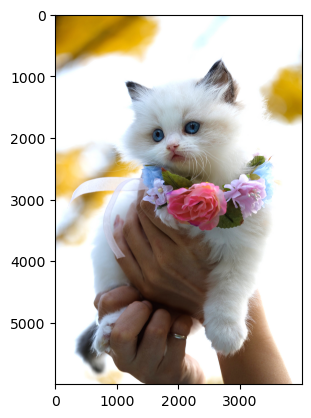

In [60]:
import cv2

# Load the image using OpenCV
image = cv2.imread("C:/Users/uday.bijjala/Downloads/kitten_132.jpg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Convert the image to the YUV color space
yuv_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)

# Extract the Y channel (luminance) from the YUV image
y_channel = yuv_image[:, :, 0]

# Calculate the average luminosity value of the image
average_luminosity = y_channel.mean()

print("Average Luminosity:", average_luminosity)
plt.imshow(image)

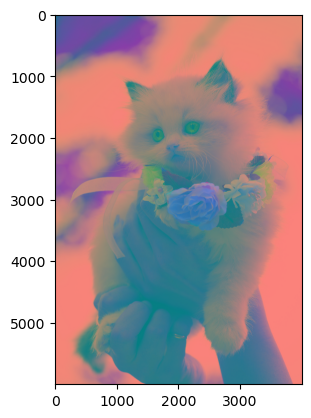

In [37]:
plt.imshow(yuv_image)

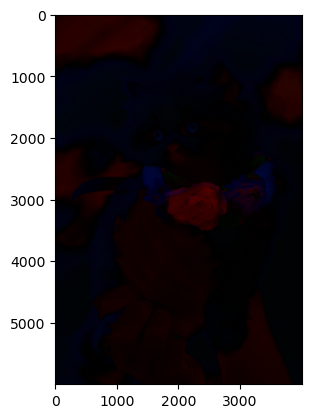

In [57]:
yuv_image1=yuv_image.copy()
yuv_image1[:,:,0]=yuv_image1[:,:,0]-(yuv_image1[:,:,0])*1
yuv_image1 = cv2.cvtColor(yuv_image1, cv2.COLOR_YUV2RGB)
plt.imshow(yuv_image1)

In [66]:
import sys
from PIL import Image


def calculate_brightness(image):
    greyscale_image = image.convert('L')
    histogram = greyscale_image.histogram()
    pixels = sum(histogram)
    brightness = scale = len(histogram)

    for index in range(0, scale):
        ratio = histogram[index] / pixels
        brightness += ratio * (-scale + index)

    return 1 if brightness == 255 else brightness / scale



image = Image.open("D:/cat_id/RedditImageScraper-main_temp/RedditImageScraper-main/images/kitten1/kitten14.jpg")
print("%s" % ( calculate_brightness(image)))

0.6307735898903218


In [2]:
import cv2
import numpy as np
from PIL import Image, ImageEnhance
from numpy import asarray
import os


def vignette_new(image, level = 2): 
    height, width = image.shape[:2]

    x_resultant_kernel = cv2.getGaussianKernel(width, width/level)
    y_resultant_kernel = cv2.getGaussianKernel(height, height/level)

    kernel = y_resultant_kernel * x_resultant_kernel.T
    mask = kernel / kernel.max()

    image_vignette = np.copy(image)

    for i in range(3):
        image_vignette[:,:,i] = image_vignette[:,:,i] * mask

    return image_vignette


def convert_to_night_vision_new(image_path,grayscale_contrast=0.7,brightness = 0.65,
                                 amp_rc = 1.65,amp_gc = 1.0,amp_bc = 1.7):
# Open the image
    image = Image.open(image_path)

    # Convert the image to grayscale
    grayscale_image = image.convert("L")

    # Enhance the contrast
    enhanced_image = ImageEnhance.Contrast(grayscale_image).enhance(grayscale_contrast)

    # Convert the image to RGB mode
    rgb_image = enhanced_image.convert("RGB")
    # Lowering Brightness of image to check low light
    rgb_image = ImageEnhance.Brightness(rgb_image).enhance(brightness)

    # Split the image into individual color channels
    r, g, b = rgb_image.split()
    # Amplify the green color channel
    amplified_r_channel = ImageEnhance.Brightness(r).enhance(amp_rc)
    amplified_g_channel = ImageEnhance.Brightness(g).enhance(amp_gc)
    amplified_b_channel = ImageEnhance.Brightness(b).enhance(amp_bc)

    # Create a new RGB image using amplified green channel
    night_vision_image = Image.merge("RGB", (amplified_r_channel, amplified_g_channel, amplified_b_channel))

    #VIGNETTE
    input = asarray(night_vision_image.resize((256, 256)))

    # input
    vig_img = vignette_new(input,3)
    # Save the night vision image
    image2 = Image.fromarray(vig_img)

    return image2,vig_img

In [3]:

c=0
for i in os.listdir("D:/cat_id/test/nv_normal"):
    if "jpg" in i:
        j=i.split(".jp")[0]
        ima,vig=convert_to_night_vision_new(f"D:/cat_id/test/nv_normal/{i}")
        cv2.imwrite(f"D:/cat_id/test/nv/{j}_night.jpg",vig)   
        c=c+1
    else:
        j=i.split(".pn")[0]
        ima,vig=convert_to_night_vision_new(f"D:/cat_id/test/nv_normal/{i}")
        cv2.imwrite(f"D:/cat_id/test/nv/{j}_night.jpg",vig)   
        c=c+1

In [24]:
for i in os.listdir("D:/cat_id/inference2/house_3033/cat/52449296/"):
    ima,vig=convert_to_night_vision_new(f"D:/cat_id/inference2/house_3033/cat/52449296/{i}")
    cv2.imwrite(f"C:/Users/uday.bijjala/cat_visual_id-master/cat_visual_id-master/data/raw/inference_data/house_1/new1_{c}.jpg",vig)
    c=c+1

In [35]:
import shutil
c=0
for i in os.listdir("D:/cat_id/training2/house_2/cat/Hello Kitty photos/"):
    shutil.copy(f"D:/cat_id/training2/house_2/cat/Hello Kitty photos/{i}",f"C:/Users/uday.bijjala/cat_visual_id-master/cat_visual_id-master/data/raw/enroll_data/house_1/cat/hello_kitty/kitty_{c}.jpg")
    c=c+1

In [36]:
import shutil
for i in os.listdir("D:/cat_id/inference2/house_2/cat/Hello Kitty photos/"):
    shutil.copy(f"D:/cat_id/inference2/house_2/cat/Hello Kitty photos/{i}",f"C:/Users/uday.bijjala/cat_visual_id-master/cat_visual_id-master/data/raw/inference_data/house_1/kitty_{c}.jpg")
    c=c+1

In [40]:
img=cv2.imread("C:/Users/uday.bijjala/cat_visual_id-master/cat_visual_id-master/data/raw/previous/house_flop_gremline_t5/house_1_infer/flop_251.jpg")
RGB_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
resized_img = cv2.resize(RGB_img, (256, 256))
embedding = model.predict(np.expand_dims(resized_img, axis=0))
flop_251=embedding[0]

In [42]:
flop=[0.10112666400770347, -0.27092211941878, -0.02937719695425282, -0.002206634497269988, 0.06083895700673262, -0.11322362224260966, -0.08402599828938644, -0.013510576556048667, -0.025851446048667032, -0.03095704053218166, 0.12977437923351923, -0.010016063208846996, -0.022508740502720077, -0.14649696399768194, -0.10509011149406433, 0.013869144410515824, 0.028797661187127233, 0.16014464447895685, -0.014944714649269978, 0.10852579151590665, -0.11553029591838519, -0.14729262640078863, -0.05497788079082966, 0.03796332057875892, 0.02090577951942881, -0.0064736212564942735, 0.03350611279408137, -0.2965663919846217, -0.05965586192905903, 0.21126563350359598, 0.19069176415602365, -0.0033054509355376163, 0.12394758810599645, -0.061564656595389046, 0.23834176113208136, 0.07555699907243252, 0.10125431294242541, -0.10786721979578336, -0.16499668111403784, 0.022523137973621488, -0.09491216391324997, -0.09049130231142044, 0.1299453837176164, 0.18696779509385428, 0.04919815824056665, -0.015285471609483162, -0.1720974544684092, 0.11586048950751622, -0.07799852453172207, 0.18122970312833786, 0.10798529411355655, -0.28701651096343994, -0.1872146874666214, -0.25004833191633224, 0.03807366732507944, -0.21587645014127096, -0.0004350875969976187, 0.012953545587758223, -0.058845592041810356, -0.13924462224046388, -0.00404813711065799, -0.09576111659407616, 0.09830152988433838, 0.038664087012875825]
gremline=[0.19800250604748726, -0.1959939325849215, -0.055610385412971176, -0.057113856387635074, 0.03967998642474413, 0.189142394810915, -0.07062031328678131, 0.2395737593372663, 0.03949363622814417, -0.2071370209256808, 0.06469539296813309, 0.0715674323340257, -0.1266981139779091, 0.0046917288564145565, -0.08919420217474301, 0.08502039934198062, -0.011621547707666954, 0.22463791817426682, 0.05531056546897162, 0.08652395941317081, 0.04976674262434244, -0.21581847965717316, -0.03197622578591108, -0.12245231121778488, 0.133068627367417, -0.07089420749495427, 0.169525737563769, -0.07380031157905857, -0.13619327048460642, 0.145025339598457, -0.02806454012170434, 0.10440654431780179, 0.10985715687274933, -0.049294585653115064, 0.09501205788304408, 0.02825963559250037, -0.19045714288949966, 0.008400192329039177, 0.02694584894925356, -0.013639067454884449, -0.06961922068148851, 0.05694986693561077, 0.04015197791159153, 0.06519680617687602, 0.08341899793595076, -0.09643318286786477, -0.10398609315355618, 0.07889201367894809, -0.0723154116421938, -0.09534385055303574, 0.22811583429574966, -0.0688931265710077, -0.10541763280828793, -0.2425931841135025, -0.07726567797362804, -0.06284317622582118, 0.095226909344395, -0.011157678595433632, 0.1742713712155819, -0.013566677769025167, -0.21230986714363098, 0.08008376477907102, 0.011417096325506767, -0.11991013710697492]


In [45]:
import numpy as np
dist = np.sum(np.square(np.subtract(flop, flop_251)))
dist

1.1895958176462762